In [1]:
%load_ext autoreload

import os, sys
import networkx as nx

sys.path.insert(0, "../")
sys.path.insert(0, "/home/j/joppich/.local/lib/python3.11/site-packages/")
#otherwise leidenalg is used in an outdated version ...

import leidenalg as la
print("la", la.version)

%autoreload 2
from PICASO.kgraph import *
import pandas as pd
import numpy as np

import matplotlib
import matplotlib.pyplot as plt

from collections import defaultdict, Counter

import random
random.seed(42)

import pickle

la 0.10.2


/mnt/extproj/projekte/bartelt/software/miniconda3/envs/regnetworks/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
kg = KGraph()
kg.load_kgraph("../data/picaso_network_human.out")

In [3]:
kg

KGraph KGraph with 171852 nodes and 2044325 edges

In [5]:
exprKGs = None
exprKGs = pickle.load(open("myocardial_exprkgs.pickle", "rb"))

In [6]:
tissue2zone2kg = defaultdict(lambda : dict())
for x in exprKGs:
    tissue, zone = x.split("_")
    
    tissue2zone2kg[tissue]["{}_{}".format(tissue, zone)] = exprKGs[x]

In [7]:
for x in tissue2zone2kg:
    print(x, len(tissue2zone2kg[x]), [x for x in tissue2zone2kg[x]])

Adipocyte 5 ['Adipocyte_BZ', 'Adipocyte_CTRL', 'Adipocyte_FZ', 'Adipocyte_IZ', 'Adipocyte_RZ']
Cardiomyocyte 5 ['Cardiomyocyte_BZ', 'Cardiomyocyte_CTRL', 'Cardiomyocyte_FZ', 'Cardiomyocyte_IZ', 'Cardiomyocyte_RZ']
Cycling cells 5 ['Cycling cells_BZ', 'Cycling cells_CTRL', 'Cycling cells_FZ', 'Cycling cells_IZ', 'Cycling cells_RZ']
Endothelial 5 ['Endothelial_BZ', 'Endothelial_CTRL', 'Endothelial_FZ', 'Endothelial_IZ', 'Endothelial_RZ']
Fibroblast 5 ['Fibroblast_BZ', 'Fibroblast_CTRL', 'Fibroblast_FZ', 'Fibroblast_IZ', 'Fibroblast_RZ']
Lymphoid 5 ['Lymphoid_BZ', 'Lymphoid_CTRL', 'Lymphoid_FZ', 'Lymphoid_IZ', 'Lymphoid_RZ']
Mast 5 ['Mast_BZ', 'Mast_CTRL', 'Mast_FZ', 'Mast_IZ', 'Mast_RZ']
Myeloid 5 ['Myeloid_BZ', 'Myeloid_CTRL', 'Myeloid_FZ', 'Myeloid_IZ', 'Myeloid_RZ']
Neuronal 5 ['Neuronal_BZ', 'Neuronal_CTRL', 'Neuronal_FZ', 'Neuronal_IZ', 'Neuronal_RZ']
Pericyte 5 ['Pericyte_BZ', 'Pericyte_CTRL', 'Pericyte_FZ', 'Pericyte_IZ', 'Pericyte_RZ']
vSMCs 5 ['vSMCs_BZ', 'vSMCs_CTRL', 'vSMCs_FZ

In [8]:
zoneSort = {
        "CTRL": 0,
        "RZ": 1,
        "BZ": 2,
        "IZ": 3,
        "FZ": 4
    }

In [9]:
network_extend_spec = {"geneset": {"min_gene_spec": 0.5,
                                   "min_edge_quantile": 0.2,
                                   "max_edge_quantile": 1.0,
                                   "max_size_gs": 200,
                                   "min_fraction_large": 0.7,
                                   "min_fraction_small": 0.6},
                       "disease": {"min_gene_spec": 0.5,
                                   "min_edge_quantile": 0.2,
                                   "max_edge_quantile": 1.0,
                                   "max_size_gs": 100,
                                   "min_fraction_large": 0.7,
                                   "min_fraction_small": 0.6},
                      "metabolic_pathway": {"min_gene_spec": 0,
                                   "min_edge_quantile": 0.4,
                                   "max_edge_quantile": 1.0,
                                   "max_size_gs": 100,
                                   "min_fraction_large": 0.4,
                                   "min_fraction_small": 0.4},
                      "cell_death_pw": {"min_gene_spec": 0.1,
                                   "min_edge_quantile": 0.4,
                                   "max_edge_quantile": 1.0,
                                   "max_size_gs": 100,
                                   "min_fraction_large": 0.4,
                                   "min_fraction_small": 0.4},
                      "metabolite_targets": {"min_gene_spec": 0.1,
                                   "min_edge_quantile": 0.4,
                                   "max_edge_quantile": 1.0,
                                   "max_size_gs": 100,
                                   "min_fraction_large": 0.4,
                                   "min_fraction_small": 0.4}
                      }

min_node_scores={"drug": 0.8, "ncRNA": 0.8}

In [15]:
! rm -rf diff_*/ module_plots/

In [16]:
import logging
date_strftime_format = "%Y-%m-%y %H:%M:%S"
logging.basicConfig(stream=sys.stdout, level=logging.INFO, format="%(asctime)s %(message)s", datefmt=date_strftime_format)

In [17]:
tlda = TwoLevelDifferentialAnalysis(tissue2zone2kg, [x for x in zoneSort], output_folder_formatter="diff_{}/", fullKG=kg, cgcond_sep="_")

In [18]:
#%%capture captured_plot_module_calc
tlda.calculate_modules(relevant_cellgroups=None, reference_formatter="{}_CTRL", cg_zone_formatter="{}_{}",
                        min_effect_size=0.4, min_enriched=0.8, minEdgeScore=1.0, resolution=6, min_nodes=10, max_comm_size=150,
                        min_node_scores = min_node_scores, network_extend_spec=network_extend_spec, verbose=False,
                       calculate_dkgs=True, calculate_diff_comms=False, calculate_extensions=False
                      )

min_effect_size 0.4
min_enriched 0.8
min_nodes 10
max_comm_size 150
score_field fc_score
verbose False
extend_node_types ['gene', 'TF', 'ncRNA']
resolution 6
minEdgeScore 1.0
min_node_scores {'drug': 0.8, 'ncRNA': 0.8}
network_extend_spec {'geneset': {'min_gene_spec': 0.5, 'min_edge_quantile': 0.2, 'max_edge_quantile': 1.0, 'max_size_gs': 200, 'min_fraction_large': 0.7, 'min_fraction_small': 0.6}, 'disease': {'min_gene_spec': 0.5, 'min_edge_quantile': 0.2, 'max_edge_quantile': 1.0, 'max_size_gs': 100, 'min_fraction_large': 0.7, 'min_fraction_small': 0.6}, 'metabolic_pathway': {'min_gene_spec': 0, 'min_edge_quantile': 0.4, 'max_edge_quantile': 1.0, 'max_size_gs': 100, 'min_fraction_large': 0.4, 'min_fraction_small': 0.4}, 'cell_death_pw': {'min_gene_spec': 0.1, 'min_edge_quantile': 0.4, 'max_edge_quantile': 1.0, 'max_size_gs': 100, 'min_fraction_large': 0.4, 'min_fraction_small': 0.4}, 'metabolite_targets': {'min_gene_spec': 0.1, 'min_edge_quantile': 0.4, 'max_edge_quantile': 1.0, 'max_

In [22]:
#%%capture captured_plot_module_calc
tlda.calculate_modules(relevant_cellgroups=None, reference_formatter="{}_CTRL", cg_zone_formatter="{}_{}",
                        min_effect_size=0.4, min_enriched=0.8, minEdgeScore=1.0, resolution=6, min_nodes=10, max_comm_size=150,
                        min_node_scores = min_node_scores, network_extend_spec=network_extend_spec, verbose=False,
                       calculate_dkgs=False, calculate_diff_comms=True, calculate_extensions=False
                      )

min_effect_size 0.4
min_enriched 0.8
min_nodes 10
max_comm_size 150
score_field fc_score
verbose False
extend_node_types ['gene', 'TF', 'ncRNA']
resolution 6
minEdgeScore 1.0
min_node_scores {'drug': 0.8, 'ncRNA': 0.8}
network_extend_spec {'geneset': {'min_gene_spec': 0.5, 'min_edge_quantile': 0.2, 'max_edge_quantile': 1.0, 'max_size_gs': 200, 'min_fraction_large': 0.7, 'min_fraction_small': 0.6}, 'disease': {'min_gene_spec': 0.5, 'min_edge_quantile': 0.2, 'max_edge_quantile': 1.0, 'max_size_gs': 100, 'min_fraction_large': 0.7, 'min_fraction_small': 0.6}, 'metabolic_pathway': {'min_gene_spec': 0, 'min_edge_quantile': 0.4, 'max_edge_quantile': 1.0, 'max_size_gs': 100, 'min_fraction_large': 0.4, 'min_fraction_small': 0.4}, 'cell_death_pw': {'min_gene_spec': 0.1, 'min_edge_quantile': 0.4, 'max_edge_quantile': 1.0, 'max_size_gs': 100, 'min_fraction_large': 0.4, 'min_fraction_small': 0.4}, 'metabolite_targets': {'min_gene_spec': 0.1, 'min_edge_quantile': 0.4, 'max_edge_quantile': 1.0, 'max_

/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:2486: RuntimeWarning: divide by zero encountered in scalar divide
  return (u1 - u2) / s


2025-03-25 20:50:02 Sig Community Stats
Number of communities: 42
Average community size 40.833333333333336
Median community size 35.5
Quantile (0,0.25,0.5,0.75,1) community size [ 13.    25.25  35.5   44.75 119.  ]
2025-03-25 20:50:02 Analysing Mast-Mast_BZ


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:2224: RuntimeWarning: invalid value encountered in scalar add
  avgCohen = sum(cohens)


2025-03-25 20:50:05 All Community Stats
Number of communities: 161
Average community size 33.29192546583851
Median community size 30.0
Quantile (0,0.25,0.5,0.75,1) community size [  2.  15.  30.  46. 149.]
2025-03-25 20:50:07 Sig Community Stats
Number of communities: 53
Average community size 39.716981132075475
Median community size 33.0
Quantile (0,0.25,0.5,0.75,1) community size [ 13.  24.  33.  47. 138.]
2025-03-25 20:50:07 Analysing Mast-Mast_IZ
2025-03-25 20:50:10 All Community Stats
Number of communities: 164
Average community size 36.207317073170735
Median community size 29.0
Quantile (0,0.25,0.5,0.75,1) community size [  2.  18.  29.  47. 340.]
2025-03-25 20:50:12 Sig Community Stats
Number of communities: 46
Average community size 36.108695652173914
Median community size 28.0
Quantile (0,0.25,0.5,0.75,1) community size [ 12.  21.  28.  42. 120.]
2025-03-25 20:50:12 Analysing Mast-Mast_FZ
2025-03-25 20:52:27 All Community Stats
Number of communities: 173
Average community size

In [23]:
#%%capture captured_plot_module_calc
tlda.calculate_modules(relevant_cellgroups=None, reference_formatter="{}_CTRL", cg_zone_formatter="{}_{}",
                        min_effect_size=0.4, min_enriched=0.8, minEdgeScore=1.0, resolution=6, min_nodes=10, max_comm_size=150,
                        min_node_scores = min_node_scores, network_extend_spec=network_extend_spec, verbose=False,
                       calculate_dkgs=False, calculate_diff_comms=False, calculate_extensions=True
                      )

min_effect_size 0.4
min_enriched 0.8
min_nodes 10
max_comm_size 150
score_field fc_score
verbose False
extend_node_types ['gene', 'TF', 'ncRNA']
resolution 6
minEdgeScore 1.0
min_node_scores {'drug': 0.8, 'ncRNA': 0.8}
network_extend_spec {'geneset': {'min_gene_spec': 0.5, 'min_edge_quantile': 0.2, 'max_edge_quantile': 1.0, 'max_size_gs': 200, 'min_fraction_large': 0.7, 'min_fraction_small': 0.6}, 'disease': {'min_gene_spec': 0.5, 'min_edge_quantile': 0.2, 'max_edge_quantile': 1.0, 'max_size_gs': 100, 'min_fraction_large': 0.7, 'min_fraction_small': 0.6}, 'metabolic_pathway': {'min_gene_spec': 0, 'min_edge_quantile': 0.4, 'max_edge_quantile': 1.0, 'max_size_gs': 100, 'min_fraction_large': 0.4, 'min_fraction_small': 0.4}, 'cell_death_pw': {'min_gene_spec': 0.1, 'min_edge_quantile': 0.4, 'max_edge_quantile': 1.0, 'max_size_gs': 100, 'min_fraction_large': 0.4, 'min_fraction_small': 0.4}, 'metabolite_targets': {'min_gene_spec': 0.1, 'min_edge_quantile': 0.4, 'max_edge_quantile': 1.0, 'max_

In [24]:
with open("myocardial_tlda.pickle", 'wb') as f:    
    pickle.dump(tlda, f)

In [5]:
import pickle
with open("myocardial_tlda.pickle", 'rb') as f:    
    tlda = pickle.load(f)

In [26]:
tlda.plot_module_comparisons(plot_communities=True)

Output directory diff_Adipocyte/
diff_Adipocyte//all_module_heatmap.png
diff_Adipocyte//all_module_compare.png
diff_Adipocyte//score_distribution.png
diff_Adipocyte//Adipocyte_RZ_mod_117
Min Edge Score:  -3.5102204673306807 -4.0
Max Edge Score:  4.343340575426603 5.0
Min Node Score:  -4.395645895367978 -5.0
Max Node Score:  5.47812537336245 6.0
diff_Adipocyte//Adipocyte_RZ_mod_33
Min Edge Score:  -2.2904525686012165 -3.0
Max Edge Score:  5.7760521517746435 6.0
Min Node Score:  -4.2164545841856995 -5.0
Max Node Score:  4.868076177246765 5.0
diff_Adipocyte//Adipocyte_RZ_mod_23
Min Edge Score:  -3.0786337270685307 -4.0
Max Edge Score:  4.45657509098167 5.0
Min Node Score:  -4.340377365109582 -5.0
Max Node Score:  5.194460163074487 6.0
diff_Adipocyte//Adipocyte_RZ_mod_49
Min Edge Score:  -3.544576838363586 -4.0
Max Edge Score:  5.433671648597652 6.0
Min Node Score:  -2.9963923902912835 -3.0
Max Node Score:  4.647706645477934 5.0
diff_Adipocyte//Adipocyte_RZ_mod_46
Min Edge Score:  -3.23942

In [27]:
ct=CommunityTool()
ct.compare_modules(tlda.communities, figsize=(75,75))

In [29]:
descrDF = tlda.describe_modules()
descrDF.to_csv("diff_modules_description.tsv", sep="\t")
descrDF.to_excel("diff_modules_description.xlsx")
descrDF

,name,gene_nodes,geneset_nodes,disease_nodes,drug_nodes,ncRNA_nodes,TF_nodes,other_nodes,BZ_score_median,BZ_score_mean,...,RZ_absmean-disease,RZ_absmean-drug,RZ_diffmean-gene,RZ_diffmean-disease,RZ_diffmean-drug,base_condition,base_zone,base_condition_score_mean,base_condition_score_median,cellgroup
0,Adipocyte_RZ_mod_117,"[B3GALT5, B3GNT2, B4GALT1, B4GALT3, B4GALT5, B...","[(GO:0001665, alpha-N-acetylgalactosaminide al...",[],"[(CHEMBL3301588, TAREXTUMAB)]","[mir-122, mir-26a]",[],{},0.000000,-0.026444,...,NaN,0.288888,0.904514,NaN,0.115053,Adipocyte_RZ,RZ,1.062617,1.000857,Adipocyte
1,Adipocyte_RZ_mod_33,"[ABCB9, ARHGAP22, BCL2L12, BORA, BTC, CASKIN1,...","[(GO:0031114, regulation of microtubule depoly...",[],[],[],"[PDX1, SNAPC4, SOX11, VEZF1]",{},0.000000,1.031721,...,NaN,NaN,1.510816,NaN,NaN,Adipocyte_RZ,RZ,2.011048,1.996350,Adipocyte
2,Adipocyte_RZ_mod_23,"[A4GALT, AAGAB, ADGRV1, ANKMY2, ARHGAP15, ARHG...","[(GO:0004563, beta-N-acetylhexosaminidase acti...",[],[],[],"[MTERF3, ZNF300, ZNF793]",{},0.563116,0.777159,...,NaN,NaN,1.500082,NaN,NaN,Adipocyte_RZ,RZ,1.618392,1.529728,Adipocyte
3,Adipocyte_RZ_mod_49,"[ASB2, C19orf12, C4BPA, CALCOCO1, CEP170B, CEP...","[(GO:0060665, regulation of branching involved...",[],"[(CHEMBL148674, VARESPLADIB), (CHEMBL2105659, ...",[],"[ETV1, RFX2, TBX20]",{},0.540362,0.774924,...,NaN,0.268493,0.934420,NaN,0.267969,Adipocyte_RZ,RZ,1.501431,1.450314,Adipocyte
4,Adipocyte_RZ_mod_46,"[ABI1, ABI2, ACTR2, ACTR3, ACTR3B, ARPC1A, ARP...","[(GO:0005885, Arp2/3 protein complex), (GO:003...",[],"[(CHEMBL3301576, PEGPLERANIB SODIUM), (CHEMBL3...","[SRA1, mir-22]",[ETV6],{},0.498671,0.397834,...,NaN,0.107507,0.710016,NaN,0.068629,Adipocyte_RZ,RZ,0.941756,1.032519,Adipocyte
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1002,vSMCs_FZ_mod_142,"[AGGF1, ARHGEF1, CSF2RA, DENR, DNAJA3, ELP2, E...",[],"[(DOID:0060652, familial erythrocytosis 1), (E...","[(CHEMBL1201573, OPRELVEKIN), (CHEMBL1201670, ...","[let-7c, mir-137, mir-194, mir-27a, mir-29a, m...",[],{},-0.035143,-0.030558,...,0.394513,0.159847,0.091958,0.158303,-0.004894,vSMCs_FZ,FZ,0.602227,0.777157,vSMCs
1003,vSMCs_FZ_mod_31,"[ADCY1, CAMTA1, CAMTA2, CORIN, CRH, DAXX, DUSP...","[(GO:0031708, endothelin B receptor binding), ...",[],"[(CHEMBL1639, ALISKIREN), (CHEMBL3137301, SACU...","[URH, mir-124, mir-129, mir-141, mir-181a, mir...","[CAMTA1, CAMTA2, GATA6, HEY2, HMGA1, MEF2C, NF...",{},0.011298,0.241635,...,NaN,0.182509,-0.131270,NaN,-0.065589,vSMCs_FZ,FZ,1.348247,0.554917,vSMCs
1004,vSMCs_FZ_mod_66,"[APOC3, ATP8B1, CYP17A1, CYP7A1, DDAH1, DLAT, ...","[(GO:0004739, pyruvate dehydrogenase (acetyl-t...",[],"[(CHEMBL1201830, RILONACEPT), (CHEMBL1201834, ...","[mir-10b, mir-122, mir-124, mir-182, mir-21, m...","[HNF4A, NR1H4, NR2F1, PPARA, SOX9]",{},0.000000,0.027359,...,NaN,0.169208,-0.044020,NaN,0.009961,vSMCs_FZ,FZ,0.531829,0.098900,vSMCs
1005,vSMCs_FZ_mod_99,"[ADAMTS13, AHR, C3, CD46, CD55, CFB, CFH, CRP,...",[],"[(Orphanet:75376, Familial drusen)]",[],[mir-9],"[AHR, MZF1]",{},-0.051436,0.135379,...,0.173434,NaN,-0.113204,0.793011,NaN,vSMCs_FZ,FZ,1.110354,1.137066,vSMCs


In [30]:
geneset_overlapDF = tlda.create_overlap_df("geneset")
geneset_overlapDF.head()

82286


,celltype,community,geneset,geneset_size,geneset_name,overlap,jaccard
0,Adipocyte,Adipocyte_RZ_mod_117,GO:0000122,949,negative regulation of transcription by RNA po...,0.001054,0.001015
1,Adipocyte,Adipocyte_RZ_mod_117,GO:0000138,9,Golgi trans cisterna,0.222222,0.045455
2,Adipocyte,Adipocyte_RZ_mod_117,GO:0000139,650,Golgi membrane,0.047692,0.047256
3,Adipocyte,Adipocyte_RZ_mod_117,GO:0001501,124,skeletal system development,0.008065,0.006250
4,Adipocyte,Adipocyte_RZ_mod_117,GO:0001525,236,angiogenesis,0.004237,0.003676


In [31]:
disease_overlapDF = tlda.create_overlap_df("disease")
disease_overlapDF.head()

12873


,celltype,community,disease,disease_size,disease_name,overlap,jaccard
0,Adipocyte,Adipocyte_RZ_mod_117,GO:0007608,114,sensory perception of smell,0.008772,0.006667
1,Adipocyte,Adipocyte_RZ_mod_117,DOID:0081180,1,autosomal recessive intellectual developmental...,1.000000,0.027027
2,Adipocyte,Adipocyte_RZ_mod_117,DOID:0111035,1,CADASIL 1,1.000000,0.027027
3,Adipocyte,Adipocyte_RZ_mod_117,DOID:5212,2,congenital disorder of glycosylation,0.500000,0.026316
4,Adipocyte,Adipocyte_RZ_mod_117,DOID:0050571,8,congenital disorder of glycosylation type II,0.125000,0.022727


In [32]:
drug_overlapDF = tlda.create_overlap_df("drug")
drug_overlapDF.head()

3195


,celltype,community,drug,drug_size,drug_name,overlap,jaccard
0,Adipocyte,Adipocyte_RZ_mod_117,CHEMBL3301588,2,TAREXTUMAB,0.500000,0.026316
1,Adipocyte,Adipocyte_RZ_mod_33,CHEMBL1200826,3,LITHIUM CARBONATE,0.333333,0.018182
2,Adipocyte,Adipocyte_RZ_mod_33,CHEMBL3545157,1,TIDEGLUSIB,1.000000,0.018868
3,Adipocyte,Adipocyte_RZ_mod_33,CHEMBL1201170,3,LITHIUM CITRATE,0.333333,0.018182
4,Adipocyte,Adipocyte_RZ_mod_33,CHEMBL362558,2,LY-2090314,0.500000,0.018519


In [33]:
celldeath_overlapDF = tlda.create_overlap_df("cell_death_pw")
celldeath_overlapDF.head()

5999


,celltype,community,cell_death_pw,cell_death_pw_size,cell_death_pw_name,overlap,jaccard
0,Adipocyte,Adipocyte_RZ_mod_117,Autosis (COVID_19),258,Autosis (COVID_19),0.003876,0.003401
1,Adipocyte,Adipocyte_RZ_mod_117,Immunogenic (COVID_19),437,Immunogenic (COVID_19),0.002288,0.002114
2,Adipocyte,Adipocyte_RZ_mod_117,"Pyroptosis (Thyroid cancer, follicular)",2,"Pyroptosis (Thyroid cancer, follicular)",0.500000,0.026316
3,Adipocyte,Adipocyte_RZ_mod_117,Pyroptosis (Stomach Carcinoma),144,Pyroptosis (Stomach Carcinoma),0.006944,0.005556
4,Adipocyte,Adipocyte_RZ_mod_117,Pyroptosis (Squamous cell carcinoma),107,Pyroptosis (Squamous cell carcinoma),0.009346,0.006993


In [34]:
mettargets_overlapDF = tlda.create_overlap_df("metabolite_targets")
mettargets_overlapDF.head()

427


,celltype,community,metabolite_targets,metabolite_targets_size,metabolite_targets_name,overlap,jaccard
0,Adipocyte,Adipocyte_RZ_mod_33,Ethanol,109,Ethanol,0.009174,0.006211
1,Adipocyte,Adipocyte_RZ_mod_33,Testosterone,229,Testosterone,0.004367,0.003559
2,Adipocyte,Adipocyte_RZ_mod_33,Oxygen,19,Oxygen,0.052632,0.014085
3,Adipocyte,Adipocyte_RZ_mod_33,Indoxyl sulfate,9,Indoxyl sulfate,0.111111,0.016393
4,Adipocyte,Adipocyte_RZ_mod_23,Adenosine triphosphate,111,Adenosine triphosphate,0.009009,0.004975


In [35]:
metpathways_overlapDF = tlda.create_overlap_df("metabolic_pathway")
metpathways_overlapDF.head()

48641


,celltype,community,metabolic_pathway,metabolic_pathway_size,metabolic_pathway_name,overlap,jaccard
0,Adipocyte,Adipocyte_RZ_mod_117,SMP0000034,23,Sphingolipid Metabolism,0.043478,0.016949
1,Adipocyte,Adipocyte_RZ_mod_117,SMP0000043,14,Galactose Metabolism,0.071429,0.020000
2,Adipocyte,Adipocyte_RZ_mod_117,SMP0000182,14,Galactosemia,0.071429,0.020000
3,Adipocyte,Adipocyte_RZ_mod_117,SMP0000347,23,Metachromatic Leukodystrophy (MLD),0.043478,0.016949
4,Adipocyte,Adipocyte_RZ_mod_117,SMP0000348,23,Globoid Cell Leukodystrophy,0.043478,0.016949


In [36]:
geneset_overlapDF.to_csv("diff_modules_description_overlap_geneset.tsv", sep="\t")
disease_overlapDF.to_csv("diff_modules_description_overlap_disease.tsv", sep="\t")
drug_overlapDF.to_csv("diff_modules_description_overlap_drug.tsv", sep="\t")
celldeath_overlapDF.to_csv("diff_modules_description_overlap_celldeath.tsv", sep="\t")
mettargets_overlapDF.to_csv("diff_modules_description_overlap_metabolitetargets.tsv", sep="\t")
metpathways_overlapDF.to_csv("diff_modules_description_overlap_metabolicpathways.tsv", sep="\t")

In [38]:
#geneset_overlapDF.to_excel("diff_modules_description_overlap_geneset.xlsx")
disease_overlapDF.to_excel("diff_modules_description_overlap_disease.xlsx")
drug_overlapDF.to_excel("diff_modules_description_overlap_drug.xlsx")
celldeath_overlapDF.to_excel("diff_modules_description_overlap_celldeath.xlsx")
mettargets_overlapDF.to_excel("diff_modules_description_overlap_metabolitetargets.xlsx")
metpathways_overlapDF.to_excel("diff_modules_description_overlap_metabolicpathways.xlsx")

In [39]:
import scanpy as sc

adata = sc.read_h5ad("snRNA-seq-submission.h5ad")
celltype_col="cell_type_original"
condition_col = "major_labl"

adata.obs[condition_col] = pd.Categorical(adata.obs[condition_col], ordered=True, categories=[x for x in zoneSort])

adata.obs["ct_region"] = adata.obs["cell_type_original"].astype(str) + "_" + adata.obs["major_labl"].astype(str)
adata.obs["ct_region"] = pd.Categorical(adata.obs["ct_region"])

In [40]:
rel_modules = descrDF[descrDF.drug_nodes.apply(len) != 0].sort_values(["base_condition", "base_condition_score_mean"], ascending=[True, False]).groupby(['base_condition']).head(3)
rel_modules

,name,gene_nodes,geneset_nodes,disease_nodes,drug_nodes,ncRNA_nodes,TF_nodes,other_nodes,BZ_score_median,BZ_score_mean,...,RZ_absmean-disease,RZ_absmean-drug,RZ_diffmean-gene,RZ_diffmean-disease,RZ_diffmean-drug,base_condition,base_zone,base_condition_score_mean,base_condition_score_median,cellgroup
24,Adipocyte_BZ_mod_65,"[A2ML1, ABI3, ABI3BP, ADARB2, AFF1, AFF3, ALDH...","[(GO:0006835, dicarboxylic acid transport), (G...",[],"[(CHEMBL1200814, ACETAZOLAMIDE SODIUM), (CHEMB...",[],"[ARID5A, EBF1, MECOM, MEF2A, MEF2C, MNX1, NFKB...",{},2.502368,2.570721,...,NaN,0.088104,1.107409,NaN,0.176957,Adipocyte_BZ,BZ,2.570721,2.502368,Adipocyte
26,Adipocyte_BZ_mod_21,"[CD99, CIB1, COBL, COBLL1, EXOSC8, MICAL1, MIC...","[(GO:0015835, peptidoglycan transport)]",[],"[(CHEMBL286738, IROSUSTAT)]","[mir-139, mir-145]",[SMYD3],{},2.381135,2.106196,...,NaN,0.216633,0.823670,NaN,0.544592,Adipocyte_BZ,BZ,2.106196,2.381135,Adipocyte
23,Adipocyte_BZ_mod_127,"[ADA, ADCY1, AKAP1, ATF7IP, BMPR1B, CCK, CDON,...","[(GO:0016941, natriuretic peptide receptor act...",[],"[(CHEMBL1201668, NESIRITIDE), (CHEMBL2108882, ...",[],"[EPAS1, GLMP, MITF, NFYC, NR3C2, TEF, TSC22D1,...",{},1.938930,1.980374,...,NaN,0.163116,0.685576,NaN,0.106103,Adipocyte_BZ,BZ,1.980374,1.938930,Adipocyte
60,Adipocyte_FZ_mod_119,"[BAK1, BAX, BCL2L1, BCL2L2-PABPN1, BOD1L1, BOK...","[(GO:0051400, BH domain binding)]",[],"[(CHEMBL2107358, OBATOCLAX MESYLATE), (CHEMBL4...","[mir-125a, mir-155, mir-193a, mir-29a]","[CXXC1, DOT1L, ELK4, KLF2]",{},0.000000,0.478357,...,NaN,0.317737,0.671743,NaN,0.264868,Adipocyte_FZ,FZ,1.912006,1.708266,Adipocyte
49,Adipocyte_FZ_mod_30,"[ADRB2, BDKRB2, BEST1, BLVRA, C5AR1, CABIN1, C...","[(GO:0004699, calcium-independent protein kina...",[],"[(CHEMBL2107872, DELCASERTIB), (CHEMBL494089, ...","[mir-125a, mir-520d, mir-9]","[ESRRA, FLI1, HMGA1, MEF2B, NR2F6, PLSCR1]",{},0.000000,0.445843,...,NaN,0.249017,0.323017,NaN,0.427957,Adipocyte_FZ,FZ,1.812277,1.802875,Adipocyte
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
949,vSMCs_IZ_mod_92,"[ATOH8, CALM2, CCDC88C, CXXC5, DVL1, FGFR1, FI...","[(Proliferation (Solitary fibrous tumor), Prol...",[],"[(CHEMBL2108313, CONBERCEPT)]","[mir-126, mir-361]","[ATOH8, CXXC5]",{},-0.315490,-0.253471,...,NaN,0.200325,-0.128688,NaN,-0.185562,vSMCs_IZ,IZ,1.352791,1.361455,vSMCs
955,vSMCs_IZ_mod_140,"[ANXA1, C5, C5AR1, C5AR2, CD24, CEBPD, COL13A1...","[(GO:0004878, complement component C5a recepto...",[],"[(CHEMBL2095222, OCRIPLASMIN)]",[mir-218],"[CEBPD, PAX3, SNAI1, TBX18, TBX2, TRPS1]",{},0.171459,0.255048,...,NaN,0.403644,0.064986,NaN,-0.161996,vSMCs_IZ,IZ,1.220034,1.306421,vSMCs
964,vSMCs_IZ_mod_8,"[ACYP2, ALDH9A1, ALOX5, APOL3, APPBP2, ARIH2, ...","[(GO:0071659, negative regulation of IP-10 pro...",[],"[(CHEMBL2103847, TOSEDOSTAT)]","[PVT1, mir-106b, mir-133a, mir-148a, mir-15a, ...","[ASH1L, BHLHE41, CEBPE, CSRNP1, FOXP4, GATA1, ...",{},0.000000,0.079289,...,NaN,0.237663,-0.103829,NaN,-0.194071,vSMCs_IZ,IZ,1.205774,1.235776,vSMCs
920,vSMCs_RZ_mod_28,"[APLP2, BACH1, CD14, CEBPD, CHMP6, CPE, CPM, C...",[],"[(DOID:0111363, Heinz body anemia), (DOID:1099...","[(CHEMBL18901, EFAPROXIRAL), (CHEMBL4101807, V...",[],"[BACH1, CEBPD, EPAS1, ETV6, GTF2I, KAT7, NFIC,...",{},0.397458,0.320517,...,0.065357,0.085585,0.149041,1.512635,0.269169,vSMCs_RZ,RZ,0.864394,0.960099,vSMCs


In [41]:
adata

AnnData object with n_obs × n_vars = 191795 × 29126
    obs: 'sample', 'n_counts', 'n_genes', 'percent_mito', 'doublet_score', 'dissociation_score', 'cell_type_original', 'patient_region_id', 'patient', 'patient_group', 'major_labl', 'final_cluster', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'ethnicity_ontology_term_id', 'is_primary_data', 'organism_ontology_term_id', 'sex_ontology_term_id', 'tissue_ontology_term_id', 'ct_region'
    var: 'feature_biotype', 'feature_is_filtered'
    uns: 'X_approximate_distribution', 'X_normalization', 'batch_condition', 'cell_type_original_colors', 'default_embedding', 'schema_version', 'title'
    obsm: 'X_harmony', 'X_pca', 'X_umap'

In [42]:
tlda.describe_module_scrna(adata, celltype_col, condition_col, module_names=list(rel_modules.name), show_plot=False, plot_folder="module_plots")

disease 12873
geneset 82286
drug 3195
['SLC25A10', 'FBXL5', 'LIME1', 'NECTIN4', 'CDH13', 'FZD8', 'AMZ1', 'RILPL2', 'ALDH1A3', 'PTP4A2', 'VIT', 'DRAM2', 'PMVK', 'HLA-DPA1', 'FZD10', 'TRIB2', 'SULF1', 'EFCAB7', 'LY86', 'SLC13A3', 'SEC24A', 'UPK1B', 'CDH15', 'FZD5', 'LAPTM4A', 'MEF2A', 'ADARB2', 'TMEM40', 'IQCE', 'KHNYN', 'BCAS1', 'IFI30', 'FZD7', 'MYO3B', 'CSTA', 'ANKRD27', 'UPP2', 'RNF43', 'RABGGTA', 'LAPTM4B', 'SH2B3', 'GSDMA', 'DHX35', 'ZBTB25', 'XG', 'AFF1', 'GCC2', 'ARHGAP27', 'LNX2', 'CTSF', 'SIDT1', 'KDF1', 'CYB561A3', 'TAPBPL', 'DPYD', 'DOK3', 'TNFRSF8', 'SLC2A5', 'R3HCC1', 'SLC35B2', 'CCDC28B', 'LIPH', 'GALR1', 'RILPL1', 'IER2', 'CLDN9', 'NFKB1', 'PPAN', 'ABI3BP', 'FZD3', 'SLC12A8', 'ITGAL', 'TRPV3', 'IL23R', 'RIMS2', 'FSD2', 'TCF12', 'MEF2C', 'CAPN9', 'EPS8L2', 'FZD9', 'ARL4A', 'NPIPA1', 'NEURL2', 'RAPGEFL1', 'NAPSA', 'ZC3H12D', 'PTAFR', 'TMEM129', 'LAPTM5', 'CLDN1', 'CNR2', 'PATJ', 'GSTM4', 'RUBCNL', 'CA12', 'SERINC2', 'TSPOAP1', 'MOB3A', 'CHD2', 'SULF2', 'A2ML1', 'KRT18', 'AN

/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Adipocyte_BZ_mod_65 :  module_plots/overview_plot_Adipocyte_BZ_mod_65.png
['SLC15A4', 'SUMF2', 'TNNI3K', 'PODXL', 'PDZK1', 'SETD7', 'MICALL1', 'COBLL1', 'RGCC', 'MICALL2', 'WIPF3', 'PACSIN2', 'COBL', 'SLC9A3R2', 'PDZRN3', 'SLC15A2', 'MMP1', 'PTK2', 'CIB1', 'MICAL1', 'EXOSC8', 'MICAL2', 'SUMF1', 'OIP5', 'SMYD2', 'MUSK', 'CD99', 'TRIP6', 'NCKIPSD', 'SMYD3', 'STS', 'NEDD9', 'mir-139', 'mir-145']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Adipocyte_BZ_mod_21 :  module_plots/overview_plot_Adipocyte_BZ_mod_21.png
['CRTAC1', 'TEF', 'TTLL10', 'HTR3A', 'PHACTR3', 'MARCKS', 'GIP', 'FAP', 'TSC22D1', 'ZFP90', 'BMPR1B', 'PAM', 'PHACTR1', 'TBC1D24', 'GCA', 'ZNF567', 'DPP4', 'CDON', 'MITF', 'NPPC', 'PRKG1', 'EPAS1', 'EDN1', 'SLC8A2', 'TTLL7', 'ADA', 'CRIP2', 'DPP8', 'EDN3', 'RNF220', 'EFCAB6', 'FHAD1', 'PMEL', 'NR3C2', 'TNNC1', 'TNNI1', 'CCK', 'SLC8A1', 'OCA2', 'NFYC', 'NPR1', 'GLMP', 'MAP3K20', 'MCF2L', 'TTLL11', 'LTK', 'AKAP1', 'NPPB', 'NPPA', 'ATF7IP', 'TNNT1', 'TNNI3', 'TNNT2', 'SCRN1', 'NPR3', 'TTLL4', 'CRH', 'ADCY1', 'SLC8A3', 'FANCF']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Adipocyte_BZ_mod_127 :  module_plots/overview_plot_Adipocyte_BZ_mod_127.png
['DAD1', 'TRIM28', 'FSCN1', 'DOT1L', 'COX5B', 'UBAC1', 'VDAC1', 'BAX', 'TPT1', 'MCL1', 'CXXC1', 'DNAJA1', 'USP9X', 'RHOU', 'BCL2L2-PABPN1', 'CCDC36', 'SMYD1', 'RPS6KB2', 'BAK1', 'KLF2', 'FABP5', 'BCL2L1', 'MBTPS1', 'DNAJA2', 'BOD1L1', 'HDGF', 'VIM', 'BOK', 'ELK4', 'mir-29a', 'mir-155', 'mir-193a', 'mir-125a']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Adipocyte_FZ_mod_119 :  module_plots/overview_plot_Adipocyte_FZ_mod_119.png
['HMGA1', 'ENOX1', 'PTPN22', 'BEST1', 'NHERF1', 'BLVRA', 'HDAC5', 'C5AR1', 'HABP4', 'MEF2B', 'ESRRA', 'PRKCD', 'FLI1', 'PLSCR1', 'NR2F6', 'MEP1B', 'ENOX2', 'PRSS23', 'FBXO25', 'LIMK2', 'PRKCH', 'TAGLN', 'TBXA2R', 'CHN2', 'CABIN1', 'PPIB', 'VPS72', 'TUT1', 'ADRB2', 'BDKRB2', 'F11R', 'MARCKSL1', 'PRKCQ', 'GRK6', 'mir-125a', 'mir-9', 'mir-520d']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Adipocyte_FZ_mod_30 :  module_plots/overview_plot_Adipocyte_FZ_mod_30.png
['SLC25A10', 'SUMF2', 'PAG1', 'GGPS1', 'ADGRF3', 'WRAP73', 'CD99L2', 'SOAT1', 'CDH13', 'ARSF', 'NSDHL', 'SC5D', 'WDR20', 'SREBF2', 'SLC25A6', 'TMEM80', 'GALNS', 'CYP46A1', 'LIPA', 'ARSD', 'FUCA1', 'PMVK', 'SGSH', 'NAGLU', 'ZEB1', 'ARSB', 'SUMF1', 'NFYC', 'DHCR7', 'CD99', 'DHCR24', 'SEC23B', 'TMEM129', 'STS', 'ASPG', 'PIP4P1', 'TASP1', 'B3GNTL1', 'IDUA', 'IDS', 'C1orf159']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Adipocyte_FZ_mod_61 :  module_plots/overview_plot_Adipocyte_FZ_mod_61.png
['RND3', 'FAM13A', 'ERC1', 'KITLG', 'FEZ2', 'BSN', 'ANKS1A', 'CDC42EP5', 'FRS2', 'NREP', 'ADARB1', 'ERC2', 'VCAM1', 'FEZ1', 'UNC13B', 'UNC13C', 'TLK2', 'KIF11', 'NASP', 'ASF1A', 'LARP1', 'RHOQ', 'AMOTL1', 'PRKCZ', 'CLASP1', 'DDB1', 'UNC13A', 'UBE4B', 'ADAL', 'HAT1', 'TPX2', 'C15orf41', 'MARK1', 'SPAG7', 'ASF1B', 'mir-124']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Adipocyte_IZ_mod_40 :  module_plots/overview_plot_Adipocyte_IZ_mod_40.png
['AGT', 'CSF2', 'ZEB2', 'PLEKHA2', 'CXCL6', 'PTH', 'TNFSF11', 'PPCDC', 'ZFP36L2', 'CYP27B1', 'PRMT9', 'DKK4', 'ZMIZ1', 'NCAM2', 'XXYLT1', 'ELP1', 'FTO', 'TRIM56', 'DOCK5', 'CUEDC1', 'TRAK2', 'PKIG', 'EFCAB14', 'CIRBP', 'ZNF410', 'CHURC1', 'RHOT2', 'HR', 'AGTR1', 'ATP6AP2', 'IGFBP3', 'SKP2', 'FOLH1', 'RARS', 'TRAK1', 'RHOT1', 'THADA', 'GSE1', 'VDR', 'mir-124', 'mir-21', 'mir-410', 'mir-155', 'mir-15a', 'mir-16', 'mir-139', 'mir-489']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Adipocyte_IZ_mod_125 :  module_plots/overview_plot_Adipocyte_IZ_mod_125.png
['CACHD1', 'AMBN', 'FSCN1', 'PECAM1', 'ENG', 'KDR', 'COPS9', 'ECM1', 'KIDINS220', 'IKZF1', 'ANTXR1', 'TEK', 'NT5E', 'COL13A1', 'TRPS1', 'LMLN', 'GPER1', 'MCAM', 'PRSS57', 'ANGPT1', 'ITIH4', 'PROM1', 'MFN2', 'EFNB2', 'FN1', 'THY1', 'PHGDH', 'CSMD3', 'PSMA5', 'FLT1', 'ELFN1', 'TCF21', 'mir-92a']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Adipocyte_IZ_mod_128 :  module_plots/overview_plot_Adipocyte_IZ_mod_128.png
['RELL1', 'ZNF2', 'ALDH16A1', 'FAM174A', 'ARL4D', 'GPATCH1', 'KXD1', 'CAMKMT', 'MMP15', 'TBC1D32', 'CCDC97', 'ARNT2', 'MAMDC4', 'QPCTL', 'PLOD3', 'TM9SF4', 'NPW', 'TIMM44', 'PLOD2', 'ACAD11', 'VAMP5', 'SLC29A2', 'NSMF', 'INTS13', 'SLC35E1', 'SEC14L2', 'PDE12', 'R3HCC1L', 'MXRA7', 'ACE2', 'SLC41A2', 'MTFP1', 'SENP1', 'TIMM21', 'KIAA2013', 'TUSC2', 'GOLT1B', 'TPGS1', 'TLCD3A', 'BAZ2A', 'COLGALT2', 'COLGALT1', 'LGALS1', 'TRMO', 'FKBP10', 'ZMYND12', 'CLCN2', 'PHPT1', 'AJM1', 'DNAJC8', 'ZNF215', 'PRSS53', 'GEMIN7', 'FAM149B1', 'UFC1', 'KCMF1', 'RAP2B', 'EGFL7', 'SERTAD1', 'HIF1A', 'FAM219A', 'ZNF547', 'HIGD1A', 'MPP2', 'SCRN1', 'PLOD1', 'TMEM94', 'RNF181', 'OGFOD2', 'mir-145']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Adipocyte_RZ_mod_108 :  module_plots/overview_plot_Adipocyte_RZ_mod_108.png
['RASL10A', 'PLA2G6', 'PLAA', 'CEP170B', 'ETV1', 'PTH', 'FGF7', 'PLCG1', 'MAPK1', 'ASB2', 'PLA2G2A', 'PNPLA8', 'PDE4A', 'C4BPA', 'C19orf12', 'EWSR1', 'PLA2G12A', 'CEP57', 'RFX2', 'FGF10', 'DNAJC30', 'MAPKAPK2', 'FGF1', 'DDHD1', 'MAPK4', 'PLA2G4A', 'TBX20', 'TSC1', 'RIPOR1', 'FGFBP2', 'CALCOCO1']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Adipocyte_RZ_mod_49 :  module_plots/overview_plot_Adipocyte_RZ_mod_49.png
['CTAG1B', 'ENO1', 'FAM104A', 'GLYCTK', 'USP33', 'VCP', 'ERLIN2', 'PRDX4', 'SEC63', 'UBAC2', 'AMFR', 'TAPBP', 'PPIB', 'CTAG1A', 'EDEM3', 'GPI', 'HERPUD1', 'ERLEC1', 'LDHA', 'TPI1', 'PAG1', 'UBXN2A', 'EGLN3', 'GANAB', 'B2M', 'HSP90B1', 'SYVN1', 'TAP1', 'PGAM1', 'UBASH3B', 'PFKM', 'ENO3', 'PGLS', 'P4HB', 'PMCH', 'PRKCSH', 'OS9', 'TALDO1', 'ERP29', 'FAF2', 'EDEM1', 'UBXN4', 'RHBDD1', 'EGLN1', 'PFKFB1', 'RPIA', 'NPLOC4', 'DERA', 'PDIA4', 'PGAM2', 'MARCH6', 'HYOU1', 'TKT', 'NGLY1', 'DERL1', 'TMEM129', 'TAP2', 'CALR', 'PDIA5', 'HM13', 'PGK1', 'H6PD', 'LDHB', 'RNF139', 'ENO4', 'MICA', 'MANEA', 'DERL2', 'NSFL1C', 'SEL1L', 'HMBS', 'MINPP1', 'SVIP', 'AUP1', 'PDIA3', 'TSN', 'UBXN8', 'IDNK', 'PDIA6', 'CANX', 'ZFAND2B', 'UFD1', 'ERLIN1']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Adipocyte_RZ_mod_50 :  module_plots/overview_plot_Adipocyte_RZ_mod_50.png
['MED15', 'THBD', 'ZNF718', 'EML4', 'HK1', 'PMF1', 'PI4KA', 'MARK2', 'JUP', 'ARHGEF10L', 'COMT', 'KLHL22', 'TANGO2', 'KAT2B', 'ABL1', 'NFATC3', 'ITGB3', 'OPA1', 'IL2', 'LMNA', 'KCTD20', 'DMTF1', 'TREH', 'ITPRID2', 'HMOX1', 'UBE2L3', 'FABP3', 'THBS2', 'WWC2', 'CEBPA', 'FOSL1', 'PABPN1', 'SF1', 'DUSP13', 'CXCL8', 'DCN', 'PDE4DIP', 'mir-181c']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Cardiomyocyte_BZ_mod_18 :  module_plots/overview_plot_Cardiomyocyte_BZ_mod_18.png
['NUDT2', 'TALDO1', 'TBXAS1', 'TPI1', 'RBKS', 'KAT5', 'AK3', 'THRA', 'ADPGK', 'ME1', 'EGLN3', 'GAPDH', 'ESRRA', 'PRDM2', 'PKM', 'BACH1', 'ADSL', 'NT5C', 'RPIA', 'TRIM56', 'PDE3A', 'APRT', 'PFKM', 'PGM2', 'PDE10A', 'MSANTD3', 'PGLS', 'PFKL', 'CPT1A', 'PC', 'TKT', 'SYNJ2', 'AKT1', 'HPRT1', 'LBR', 'SRA1']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Cardiomyocyte_BZ_mod_86 :  module_plots/overview_plot_Cardiomyocyte_BZ_mod_86.png
['FZD7', 'POSTN', 'IL17RC', 'USH2A', 'CSF2', 'GPC1', 'SOX5', 'IL6', 'CASP7', 'C5AR1', 'NTN1', 'MAPK14', 'CAPNS1', 'PRKAR1B', 'NID1', 'EZR', 'IGFBP5', 'FPR1', 'COL1A1', 'EEF1A1', 'MTOR', 'PLEC', 'ANXA1', 'MAFF', 'DPF2', 'SLC9C1', 'VHL', 'LYN', 'EDA', 'LTBP4', 'CHL1', 'MYOM2', 'PFN1', 'LMLN', 'GPER1', 'TPM1', 'PIN1', 'LGALS1', 'LRP4', 'SPG11', 'PEBP1', 'CEACAM1', 'ITIH4', 'FBN1', 'MFN2', 'PTRH1', 'CRKL', 'FN1', 'LTBP1', 'GSN', 'ADAMTS4', 'TBP', 'SHC1', 'LGALS8', 'mir-124', 'mir-196a', 'mir-221', 'mir-224']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Cardiomyocyte_BZ_mod_22 :  module_plots/overview_plot_Cardiomyocyte_BZ_mod_22.png
['VASP', 'HEY2', 'HTR3A', 'TNF', 'GUCY1B1', 'KAT5', 'RAC1', 'GNB2', 'MARCKS', 'ZFPM2', 'NKX2-5', 'ZNF91', 'ATF6', 'ABCC8', 'PRKG1', 'EDN1', 'REN', 'PKN1', 'WWTR1', 'NR2F6', 'HIPK2', 'TBX5', 'CAMTA1', 'PLAGL1', 'EDN3', 'FGF1', 'SRF', 'CORIN', 'HIPK1', 'MME', 'ARHGEF2', 'TBX20', 'MAP3K20', 'LTK', 'LPAR3', 'GATA6', 'CALM3', 'NPPA', 'RLF', 'ZNF260', 'CAMTA2', 'CRH', 'ADCY1', 'mir-610', 'mir-21', 'mir-23b', 'mir-34c', 'mir-199a', 'mir-20a', 'mir-141', 'mir-181a', 'mir-27a', 'mir-124', 'mir-129', 'mir-9', 'mir-19b', 'mir-92a', 'mir-194', 'URH', 'mir-212']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Cardiomyocyte_FZ_mod_40 :  module_plots/overview_plot_Cardiomyocyte_FZ_mod_40.png
['CD14', 'AR', 'KAT2A', 'KLF10', 'TIMP3', 'CA9', 'SPOCK1', 'CPM', 'MDGA1', 'HECTD4', 'XIAP', 'ATOH8', 'TMEM100', 'HBA1', 'SMAD4', 'SAP30', 'HBA2', 'SPOCK3', 'URI1', 'mir-146a', 'mir-126']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Cardiomyocyte_FZ_mod_61 :  module_plots/overview_plot_Cardiomyocyte_FZ_mod_61.png
['CALM1', 'NCOR1', 'ZNF451', 'MYO10', 'VAPA', 'SMAD2', 'NEDD4L', 'CALM2', 'NTN1', 'DAPK2']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Cardiomyocyte_FZ_mod_78 :  module_plots/overview_plot_Cardiomyocyte_FZ_mod_78.png
['TNC', 'COL6A1', 'COL14A1', 'BMP1', 'DDR2', 'ITGA2', 'SDC3', 'POSTN', 'COL5A1', 'ALPL', 'GP6', 'PRRX1', 'COL24A1', 'ITGA6', 'ITGA3', 'NR4A2', 'LUM', 'SDC4', 'COL3A1', 'LAIR1', 'COL27A1', 'COL1A1', 'COL4A4', 'ZNF79', 'ITGB8', 'ITGA11', 'CD93', 'COL6A3', 'COL25A1', 'SDC2', 'ITGB3', 'ITGA9', 'DDR1', 'ADAMTS14', 'ITGA7', 'CASP8', 'PCOLCE2', 'THBS3', 'COL4A1', 'COL12A1', 'ASPN', 'COL5A2', 'CREB3L1', 'COL5A3', 'COLGALT1', 'ITGB5', 'MIA3', 'TLL1', 'P4HA2', 'PCOLCE', 'P4HA1', 'ITGAV', 'ADGRG1', 'COL6A2', 'COL7A1', 'mir-199a']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Cardiomyocyte_IZ_mod_34 :  module_plots/overview_plot_Cardiomyocyte_IZ_mod_34.png
['SERBP1', 'SERPINE2', 'LDLR', 'TNF', 'SMAD2', 'SETD2', 'SERPINE1', 'LRP1B', 'NCOA2', 'CSF3R', 'CLOCK', 'TMSB4X', 'PLAT', 'KLF10', 'PLAU', 'NPM1', 'ELANE', 'ELK1', 'ARNT', 'TPT1', 'ARNTL2', 'KLK2', 'HSF1', 'JUNB', 'TGIF2', 'NCOA1', 'BMPER', 'WWTR1', 'KDM5D', 'NPAS2', 'PLG', 'DVL2', 'GFPT1', 'F3', 'VLDLR', 'HLTF', 'VTN', 'LRP1', 'ARNTL', 'ID1', 'GATA6', 'NFIA', 'HABP2', 'MTHFR', 'ATF3', 'TFEB', 'TGFBR1', 'NR3C2', 'F12', 'mir-107', 'mir-26a', 'mir-103a', 'mir-137', 'mir-193a', 'mir-193b', 'mir-124', 'mir-221', 'mir-324', 'mir-135a', 'mir-17', 'mir-145', 'mir-205', 'mir-381', 'mir-149', 'mir-22']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Cardiomyocyte_IZ_mod_52 :  module_plots/overview_plot_Cardiomyocyte_IZ_mod_52.png
['FSCN1', 'IL17RC', 'SOX5', 'C5AR1', 'PRKAR1A', 'ENG', 'CAPNS1', 'PRKAR1B', 'FPR1', 'COPS9', 'EEF1A1', 'TGM2', 'LOX', 'ALPP', 'ECM1', 'DPF2', 'DIAPH1', 'PACS2', 'ROBO4', 'VHL', 'EDA', 'CHL1', 'LTBP4', 'CD34', 'TEK', 'COL13A1', 'PRKAB1', 'LMLN', 'CAPN2', 'GPER1', 'FBLN1', 'SPG11', 'LRP4', 'LGALS1', 'PEBP1', 'LGALS3', 'CASP3', 'ANGPT1', 'ITIH4', 'MFN2', 'BAG6', 'PTRH1', 'FN1', 'HTATIP2', 'GIT1', 'TGFBI', 'GSN', 'THRB', 'SOX13', 'TLR2', 'LGALS8', 'ANGPT2', 'mir-590', 'mir-27a', 'mir-10b', 'mir-675', 'mir-125b', 'mir-145']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Cardiomyocyte_IZ_mod_78 :  module_plots/overview_plot_Cardiomyocyte_IZ_mod_78.png
['ANKH', 'RILPL1', 'ALPL', 'GPC1', 'CCK', 'FGF2', 'IHH', 'DHH', 'RAB10', 'GAS1', 'HBA1', 'GAPDH']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Cycling cells_BZ_mod_133 :  module_plots/overview_plot_Cycling cells_BZ_mod_133.png
['TEF', 'BIRC2', 'TNNT3', 'XAF1', 'GATA4', 'FAP', 'ATF2', 'ZFP90', 'NKX2-5', 'PAM', 'GCA', 'DPP9', 'XBP1', 'DPP4', 'IDE', 'IRF8', 'HILPDA', 'EPAS1', 'CEBPB', 'DPP7', 'HOPX', 'CASP8', 'DPP8', 'TNNC1', 'STK40', 'BRCA2', 'KRIT1', 'CABIN1', 'ACE', 'NPPB', 'DACT2', 'KDM1A', 'TNNI3', 'TNNT2', 'NR3C2', 'GTF3A', 'FANCF', 'mir-34a', 'mir-27a', 'mir-489']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Cycling cells_BZ_mod_6 :  module_plots/overview_plot_Cycling cells_BZ_mod_6.png
['PEX5L', 'CKS1B', 'GALK1', 'MZF1', 'GALK2', 'CFH', 'MMP9', 'TP63', 'APBB2', 'RAF1', 'STK4', 'MMP2', 'EFEMP1', 'CPS1', 'TP73', 'TIMP3', 'CFB']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Cycling cells_BZ_mod_143 :  module_plots/overview_plot_Cycling cells_BZ_mod_143.png
['HTR3A', 'KAT5', 'GUCY1B1', 'MARCKS', 'ZFPM2', 'NKX2-5', 'PTH', 'GCA', 'ZNF91', 'SPTLC1', 'ATF6', 'IDE', 'SREBF2', 'NR2F2', 'REN', 'PKN1', 'KAT2B', 'PGAM1', 'CAMTA1', 'PLAGL1', 'NFKB2', 'TBX5', 'EDN3', 'FGF1', 'SP3', 'SRF', 'DUSP1', 'CORIN', 'HIPK1', 'SSRP1', 'TBX20', 'ABCA1', 'MAP3K20', 'MME', 'LTK', 'RLF', 'NPPA', 'MYOCD', 'DNAJB9', 'DUT', 'SIL1', 'ZNF260', 'CAMTA2', 'CRH', 'ADCY1', 'TBX18', 'mir-489', 'mir-199a', 'mir-424', 'mir-503', 'mir-124', 'mir-129', 'mir-9', 'mir-221', 'mir-223', 'mir-27a', 'mir-19b', 'mir-92a', 'URH']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Cycling cells_FZ_mod_43 :  module_plots/overview_plot_Cycling cells_FZ_mod_43.png
['CAV2', 'EPHA2', 'CAV1', 'PIH1D1', 'SLC6A4', 'BSG', 'NOS3', 'EIF2AK3', 'BCL2A1', 'HSP90B1', 'PPP5C', 'HSPB8', 'ACTR1A', 'TDRD1', 'APAF1', 'XIAP', 'DHFR', 'HSP90AB1', 'ALPK3', 'FKBP5', 'DNAJA2', 'FKBP8', 'HSP90AA1', 'ERLEC1', 'SEC24B', 'STIP1', 'ELK3', 'CHORDC1', 'CDC37', 'mir-491']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Cycling cells_FZ_mod_28 :  module_plots/overview_plot_Cycling cells_FZ_mod_28.png
['LIFR', 'CD79B', 'NEGR1', 'MAP2K5', 'GHR', 'CDC16', 'SERPINA6', 'IL6', 'LRRC4C', 'NTM', 'OSMR', 'IL7', 'CCR7', 'PRL', 'MCL1', 'FAM3C', 'IRF2', 'UBE2E1', 'ZMYND11', 'PLA2R1', 'CRLF1', 'MRC1', 'STAB1', 'LIF', 'IL27RA', 'HSPD1', 'IL6ST', 'IL17D', 'IFI16', 'SH2B1', 'BLNK', 'JAK1', 'KCTD15']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Cycling cells_FZ_mod_109 :  module_plots/overview_plot_Cycling cells_FZ_mod_109.png
['CKS1B', 'BMP1', 'COL14A1', 'COL26A1', 'SDC3', 'COL5A1', 'LOXL2', 'COL24A1', 'TP63', 'COL11A1', 'LUM', 'SDC4', 'COL3A1', 'LAIR1', 'ITGA4', 'HSPA5', 'COL16A1', 'COL27A1', 'LOX', 'ZNF79', 'ITGB8', 'CD93', 'P4HA3', 'LOXL1', 'ELN', 'ITGA9', 'DDR1', 'PCOLCE2', 'COL12A1', 'COL5A3', 'COL5A2', 'ZNF263', 'MIA3', 'STX17', 'LOXL3', 'TLL1', 'COL21A1', 'MFAP5', 'P4HA2', 'C1S', 'PCOLCE', 'P4HA1', 'ADGRG1', 'FBLN5', 'ZNF469', 'SCFD1', 'COL7A1', 'mir-125b']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Cycling cells_IZ_mod_115 :  module_plots/overview_plot_Cycling cells_IZ_mod_115.png
['ITGA8', 'COL6A1', 'EDIL3', 'ITGAE', 'ITGA3', 'COL6A6', 'ITGA11', 'COL6A3', 'ZWINT', 'MXRA8', 'THBS3', 'ITGA10', 'ITGB5', 'JAM3', 'CLEC11A', 'ITGAX', 'ITGAV', 'RRBP1', 'COL6A2', 'ITGA5']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Cycling cells_IZ_mod_87 :  module_plots/overview_plot_Cycling cells_IZ_mod_87.png
['TTF1', 'SKIL', 'ZNF711', 'TERF2IP', 'ZFHX3', 'TSC2', 'LMNB1', 'HMGA2', 'EP400', 'CDC73', 'E4F1', 'CSNK2A2', 'SMAD9', 'FTO', 'SMAD1', 'SLC26A3', 'ERCC1', 'PWWP3A', 'ATM', 'CCNB1IP1', 'SP3', 'MGP', 'ARHGAP39', 'SCNN1A', 'LPP', 'SMAD5', 'IGF2BP2', 'MAP9', 'MIA', 'VIM', 'CDKAL1', 'THADA', 'COX6C', 'mir-124', 'mir-373', 'mir-1228', 'mir-223', 'mir-27a', 'mir-142']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Cycling cells_IZ_mod_13 :  module_plots/overview_plot_Cycling cells_IZ_mod_13.png
['PAG1', 'PTPRC', 'HLA-DRB5', 'UBQLN2', 'MAP3K10', 'CTSB', 'GPR160', 'HLA-DQA2', 'DNM1L', 'KIT', 'TFRC', 'REPS1', 'SH3RF1', 'CLTC', 'PTPRJ', 'GYPA', 'AMBP', 'ITSN2', 'AAK1']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Cycling cells_RZ_mod_72 :  module_plots/overview_plot_Cycling cells_RZ_mod_72.png
['PRKCA', 'AP2A2', 'POU2AF1', 'KIF5B', 'ADRA2A', 'PRKCE', 'GRM5', 'GAP43', 'ANXA5', 'LZTFL1', 'BNC1', 'DDX5', 'GSTA4', 'GMFB', 'GRIA1', 'GRIA4', 'BBS9', 'VEGFD', 'TRPC3', 'PIP4K2A', 'DLG1', 'CAMK2D', 'ASPH', 'PRKCB', 'PLCD4', 'SLC8A1', 'ANKRD11', 'TCEAL1', 'LITAF', 'PREP', 'LAMB4', 'GSN', 'STAR', 'DLG2', 'AFAP1', 'TNNI3', 'ITPR2', 'MST1', 'GNMT']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Cycling cells_RZ_mod_76 :  module_plots/overview_plot_Cycling cells_RZ_mod_76.png
['COX10', 'KDM8', 'ACO1', 'SUCLA2', 'UCHL1', 'ZNF576', 'AHRR', 'CREB1', 'ARNT', 'KCNMA1', 'SLC25A37', 'CCDC127', 'RFX2', 'KLHL32', 'KCNMB4', 'NRF1', 'TRPC1', 'ABCB7', 'LGALS1', 'CPOX', 'YBX3', 'KCNN3', 'PPRC1', 'BNIP3', 'RNF123', 'SHMT1', 'FECH', 'HIGD1A', 'FOXM1', 'FOS', 'ELK3', 'ALAS2', 'mir-211']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Cycling cells_RZ_mod_87 :  module_plots/overview_plot_Cycling cells_RZ_mod_87.png
['IFI16', 'PLK3', 'BCL2L1', 'BCL2L14', 'HSPB1', 'CARD8', 'DDX3X', 'NLRP1', 'COX5B', 'MCL1', 'AIM2']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Endothelial_FZ_mod_116 :  module_plots/overview_plot_Endothelial_FZ_mod_116.png
['VASP', 'HEY2', 'AQP3', 'HTR3A', 'TNF', 'GUCY1B1', 'KAT5', 'MARCKS', 'ZFPM2', 'NKX2-5', 'KCND2', 'ZNF91', 'ATF6', 'PRKG1', 'NR2F2', 'REN', 'PKN1', 'KAT2B', 'NR2F6', 'HIPK2', 'TBX5', 'CAMTA1', 'PLAGL1', 'EDN3', 'DLG1', 'FGF1', 'SP3', 'SRF', 'HIPK1', 'SSRP1', 'MME', 'ARHGEF2', 'TBX20', 'MAP3K20', 'LTK', 'GATA6', 'RLF', 'NPPA', 'ZNF260', 'CAMTA2', 'CRH', 'ADCY1', 'mir-610', 'mir-874', 'mir-185', 'mir-21', 'mir-23b', 'mir-34c', 'mir-199a', 'mir-424', 'mir-20a', 'mir-27b', 'mir-302a', 'mir-141', 'mir-181a', 'mir-27a', 'mir-124', 'mir-129', 'mir-9', 'mir-326', 'mir-223', 'mir-194', 'URH', 'mir-212']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Endothelial_FZ_mod_27 :  module_plots/overview_plot_Endothelial_FZ_mod_27.png
['GTF2IRD1', 'GPHN', 'AOX1', 'GDF1', 'ABCG2', 'PCCA', 'KMT2A', 'ABCC4', 'NFE2L2', 'ANKRD1', 'GDF3', 'INHBB', 'TGFB3', 'ABCC1', 'ABCB1', 'RXRA', 'KLF12', 'ABCC3', 'NODAL', 'TGFB2']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Endothelial_FZ_mod_49 :  module_plots/overview_plot_Endothelial_FZ_mod_49.png
['HIP1R', 'PPP1R13L', 'SRSF5', 'KDM3A', 'ABI2', 'AXL', 'GRB2', 'SNX9', 'GNA12', 'GRK5', 'CAMKK1', 'WWOX', 'ZYX', 'VTI1B', 'CTTN', 'MERTK', 'TNK2', 'ITFG2', 'SYNJ1', 'NCK1']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Endothelial_IZ_mod_107 :  module_plots/overview_plot_Endothelial_IZ_mod_107.png
['ESRRG', 'GLIS3', 'CFH', 'SLC7A11', 'TFCP2', 'PAX6', 'SPP1', 'SPARC', 'FGF14', 'TCF7L2', 'CLPTM1', 'ILKAP', 'GLIS1', 'ILK', 'CLPTM1L', 'PCBP3', 'ELF1', 'ZNF3', 'IRAK1', 'KAT6B', 'RBM39', 'KIF14', 'FGF12', 'C3', 'CBFB', 'EFEMP1']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Endothelial_IZ_mod_93 :  module_plots/overview_plot_Endothelial_IZ_mod_93.png
['HOMER2', 'SOCS3', 'SH3GL1', 'SGMS1', 'TOX2', 'MAD2L1', 'RAI1', 'STIM2', 'PHACTR1', 'TNFRSF18', 'ANKRD26', 'SIPA1L2', 'EGF', 'GTDC1', 'MIF', 'AGO3', 'GSAP', 'TNRC6C', 'PTP4A2', 'PRMT1', 'PRR5L', 'DNAJB6', 'NCK2', 'MYSM1', 'MIR17HG', 'MNAT1', 'TBC1D1', 'DNAJB12', 'CTLA4', 'SLC22A4', 'EYA4', 'DENND1A', 'CTSK', 'NEK7', 'MCTP1', 'CLEC16A', 'AGO1', 'TIAM2', 'LAT2', 'IQSEC1', 'FRYL', 'NOL4L', 'FNIP2', 'AGPAT3', 'PAG1', 'SLCO3A1', 'ANKS1A', 'BCAR3', 'CBFA2T2', 'AUTS2', 'CACNB4', 'TNFSF10', 'TTC7A', 'ADA', 'TRPS1', 'TLK1', 'TNRC6A', 'IL3', 'AKNA', 'GMDS', 'ZNRF1', 'ARHGAP25', 'CBX2', 'SMYD3', 'LDLRAD4', 'TBC1D14', 'ITPR2', 'ESYT2', 'AGO2', 'SLC38A1', 'SMARCA2', 'ANKRD28', 'CDKN2B', 'PSMA1', 'TIE1', 'POLR1A', 'SSBP2', 'STON2', 'MOV10', 'SERPINB13', 'MAST4', 'TNRC18', 'FAM107B', 'RNASEH2B', 'MCTP2', 'SMG6', 'CDK6', 'GALNT2', 'PCNX2', 'HBP1', 'ARHGEF3', 'DOCK5', 'SH3TC1', 'FOXJ3', 'JMJD1C', 'I

/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Endothelial_IZ_mod_76 :  module_plots/overview_plot_Endothelial_IZ_mod_76.png
['GSK3B', 'GRM5', 'GNAQ', 'PRKCA', 'CAMK2D', 'MAPK10', 'FMR1', 'HOMER1', 'PTEN', 'CHRM5', 'CALM2', 'PRKCE']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Fibroblast_BZ_mod_10 :  module_plots/overview_plot_Fibroblast_BZ_mod_10.png
['RAD21', 'BMP1', 'MFAP5', 'PCOLCE', 'JAG1', 'FBLN5', 'LOXL2', 'TLL2', 'LOXL1', 'ELN', 'FCN1', 'LOXL3']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Fibroblast_BZ_mod_14 :  module_plots/overview_plot_Fibroblast_BZ_mod_14.png
['IKBKG', 'YES1', 'STMN1', 'PYCR1', 'ACTN2', 'COL16A1', 'ADAM9', 'MET', 'PIK3CA', 'SH3PXD2A', 'ADAM12', 'PRKCB', 'YBX3', 'ADAM17', 'EIF6', 'P4HA1', 'FSTL3', 'TJP1', 'ITGB1', 'PAPPA', 'ADAM19', 'mir-342']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Fibroblast_BZ_mod_51 :  module_plots/overview_plot_Fibroblast_BZ_mod_51.png
['JDP2', 'CSNK2A1', 'TNC', 'MARK4', 'COPS5', 'CD9', 'ALB', 'VDAC1', 'NES', 'VCAM1', 'PKD1', 'JUNB', 'MMP2', 'MAP2', 'CD55', 'NELFB', 'DDHD1', 'IL18', 'OGA', 'AHR', 'ARF4', 'DNAJB4', 'FOSB', 'MMP9', 'HDAC2', 'MAFG', 'mir-320a', 'mir-7', 'mir-940', 'mir-432', 'mir-126', 'mir-20a', 'mir-1']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Fibroblast_FZ_mod_50 :  module_plots/overview_plot_Fibroblast_FZ_mod_50.png
['LIFR', 'GNAQ', 'GADD45G', 'MYZAP', 'GRK3', 'MAP2K6', 'COMT', 'NFX1', 'MAP3K6', 'JAK2', 'CRLF1', 'RPS6KA3', 'CNTFR', 'GADD45B', 'HTR2A', 'AGTR1', 'IL6ST', 'CERS6', 'IL11RA', 'BOC', 'CCNB2', 'CCNB1', 'JAK1', 'CCNB3']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Fibroblast_FZ_mod_44 :  module_plots/overview_plot_Fibroblast_FZ_mod_44.png
['BTG2', 'EVL', 'SLC2A4', 'ANKRD1', 'CHAF1A', 'FAXDC2', 'RXRA', 'CTH', 'TXNRD1', 'FOXM1', 'CELF2', 'PABPC1', 'HSD11B1', 'CHAF1B', 'mir-34c']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Fibroblast_FZ_mod_69 :  module_plots/overview_plot_Fibroblast_FZ_mod_69.png
['RPL3', 'TNFSF11', 'PPCDC', 'EEF1A1', 'ZMIZ1', 'PTP4A2', 'KANSL3', 'VRK3', 'HNRNPF', 'DNAJB12', 'ATG5', 'TRAK1', 'SP100', 'PLXNA2', 'PTPRE', 'DPP9', 'PRMT9', 'SUMO2', 'CHAF1A', 'SUPT16H', 'PDE4D', 'SMARCE1', 'TRIM56', 'VPS51', 'NFIX', 'HIVEP3', 'ATP6AP2', 'DLEU1', 'SYNJ2', 'IRF2BP2', 'CYP7A1', 'PHLPP1', 'AGT', 'CSF2', 'PLEKHA2', 'PTH', 'COX5A', 'MN1', 'PABPC4', 'PBX4', 'DKK4', 'NCAM2', 'ERCC3', 'REN', 'BMPER', 'DOCK5', 'NADK', 'ARID1A', 'EFCAB14', 'ACVR1', 'ZNF410', 'HR', 'AGTR1', 'SKP2', 'FOLH1', 'FGGY', 'EHBP1L1', 'THADA', 'DCN', 'HNRNPA1', 'ZEB2', 'FOXK1', 'CXCL6', 'BAZ1B', 'CAP1', 'ZFP36L2', 'TET2', 'CYP27B1', 'HRH1', 'XXYLT1', 'ELP1', 'SLX4IP', 'FTO', 'CUEDC1', 'ASAP2', 'PKIG', 'RARB', 'CIRBP', 'GAS7', 'PHC2', 'FGF8', 'HIVEP2', 'TOP2B', 'RARS', 'SNW1', 'PABPC1', 'VDR', 'mir-106b', 'mir-155', 'mir-199a', 'mir-139', 'mir-146a', 'mir-223', 'mir-122', 'mir-422a', 'mir-192', 'mir-21',

/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Fibroblast_IZ_mod_10 :  module_plots/overview_plot_Fibroblast_IZ_mod_10.png
['IER3', 'PEA15', 'OLFML2A', 'USP32', 'COQ4', 'SEC61A2', 'GATA1', 'MOB3B', 'MTHFD1L', 'OAS1', 'CEBPE', 'CASP8AP2', 'COX4I2', 'EHD1', 'PRODH', 'PLEKHF2', 'IRF5', 'ABCF1', 'MYO1G', 'STAP1', 'FOXP4', 'LARP1', 'TEP1', 'SEMA6A', 'RGS19', 'UCP2', 'DAGLA', 'GM2A', 'TRAF1', 'RBMX', 'ALDH9A1', 'STARD10', 'ATAD3B', 'SURF6', 'ATAD3A', 'TMEFF2', 'STAT5A', 'MDN1', 'ST3GAL5', 'TTC3', 'KLHL28', 'MTM1', 'ADCY4', 'DPP4', 'EIF2B3', 'APOL3', 'SORL1', 'RALB', 'ZBTB17', 'WDR43', 'NFYA', 'TMEM167B', 'EEF1D', 'SBNO2', 'SGPP2', 'PARP12', 'OXTR', 'RASGRP2', 'NMI', 'RALGPS1', 'CBFA2T3', 'USP36', 'MT1F', 'ARIH2', 'TPD52', 'PHF2', 'HUWE1', 'IMPACT', 'BHLHE41', 'CD33', 'TP53INP1', 'IFNA13', 'SFRP1', 'GBGT1', 'GNG2', 'PPP2R2B', 'B3GNT2', 'NDRG2', 'FBXO10', 'NAP1L1', 'ASPHD2', 'NFE2', 'TNPO2', 'SLU7', 'SOCS1', 'PVT1', 'IFITM2', 'PIAS4', 'PIAS3', 'XPO6', 'ZNF302', 'IPO7', 'GADD45A', 'CORO2A', 'CCL5', 'PEX19', 'CPLANE

/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Fibroblast_IZ_mod_6 :  module_plots/overview_plot_Fibroblast_IZ_mod_6.png
['IL17RC', 'CFH', 'PECAM1', 'C5AR1', 'ENG', 'MMP19', 'ITGAM', 'LAMA5', 'RPS19', 'UBE2K', 'VCAM1', 'PACS2', 'ROBO4', 'BIRC5', 'C5AR2', 'COL13A1', 'PTX3', 'GPER1', 'CCN1', 'ITIH4', 'C5', 'MFN2', 'FN1', 'C3', 'MLANA', 'THY1', 'TLR2', 'MPO', 'ADM', 'ACAN', 'mir-126', 'mir-224']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Fibroblast_IZ_mod_71 :  module_plots/overview_plot_Fibroblast_IZ_mod_71.png
['LAMA2', 'TBX15', 'CD44', 'SPRY1', 'PDPN', 'EPS8', 'LY96', 'LAMC1', 'ITGA10', 'SMYD3', 'MSN', 'MET', 'SH3KBP1', 'LAMA3']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Fibroblast_RZ_mod_56 :  module_plots/overview_plot_Fibroblast_RZ_mod_56.png
['CASP9', 'TANK', 'NOD1', 'BIRC3', 'CFLAR', 'DIABLO', 'CASP8', 'CASP3', 'CASP6', 'MAP3K5', 'TICAM1', 'MAP4K4', 'TRAF1', 'GAS5', 'mir-512', 'T-ALL-R-lncR1', 'mir-19a', 'mir-20a', 'mir-301a', 'mir-221']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Fibroblast_RZ_mod_48 :  module_plots/overview_plot_Fibroblast_RZ_mod_48.png
['GATA4', 'ATF2', 'ZFP90', 'NKX2-5', 'GCA', 'XBP1', 'DPP4', 'IDE', 'EPAS1', 'HOPX', 'PSMA7', 'ACE', 'NPPB', 'YY1', 'TNNI3', 'TNNT2', 'NR3C2', 'GTF3A', 'mir-489']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Lymphoid_BZ_mod_44 :  module_plots/overview_plot_Lymphoid_BZ_mod_44.png
['MTDH', 'DUSP6', 'PIK3C3', 'GFRA1', 'IK', 'BMP2', 'RARA', 'SIN3A', 'RUNX1T1', 'ATP6V1B2', 'EEF1A1', 'BCL2', 'SLAMF6', 'CD34', 'VDAC2', 'ZBTB16', 'HDAC4', 'HBEGF', 'SLC26A5', 'GSR', 'PBX1', 'LMTK3', 'BID', 'BGLAP', 'HRK', 'PPP2R5C', 'SUMO1', 'KDM6A', 'IL3RA', 'CUL3', 'mir-181a', 'mir-1', 'mir-125a', 'mir-132', 'mir-21']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Lymphoid_FZ_mod_53 :  module_plots/overview_plot_Lymphoid_FZ_mod_53.png
['GHRHR', 'BCL2L1', 'UBXN7', 'PNPLA2', 'UBE2D3', 'HSPB1', 'F7', 'LOX', 'VEGFA', 'HVCN1', 'COX5B', 'TFPI', 'MCL1', 'F5', 'UBE2D2', 'HIF3A']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Lymphoid_FZ_mod_127 :  module_plots/overview_plot_Lymphoid_FZ_mod_127.png
['ITGA8', 'CD44', 'BMP1', 'DDR2', 'POSTN', 'COL5A1', 'ITGAE', 'PXDN', 'ITGA1', 'COL8A1', 'ITGA6', 'LAIR1', 'COL3A1', 'ADAMTS3', 'VWF', 'COL1A1', 'COL4A4', 'ITGB8', 'ITGA11', 'CD93', 'DPF2', 'COL6A3', 'COL25A1', 'F13A1', 'ITGA9', 'CASP8', 'PCOLCE2', 'COL4A1', 'ITGA10', 'COL5A3', 'COL5A2', 'COLGALT1', 'COL18A1', 'COL4A2', 'ITGB5', 'EDNRA', 'ADGRG6', 'COL1A2', 'COL4A3', 'IGBP1', 'CERT1', 'FN1', 'TLL1', 'VCL', 'CD47', 'P4HA1', 'ITGA5', 'CRK']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Lymphoid_FZ_mod_70 :  module_plots/overview_plot_Lymphoid_FZ_mod_70.png
['MMP14', 'ZNF274', 'ADAM9', 'ADAM15', 'PIK3CA', 'SH3PXD2A', 'SH3PXD2B', 'ADAM12', 'ADAM17', 'FGA', 'FGG', 'TJP1', 'ADAM19', 'mir-33a', 'mir-29c', 'mir-34c', 'mir-212', 'mir-105', 'mir-27b']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Lymphoid_IZ_mod_108 :  module_plots/overview_plot_Lymphoid_IZ_mod_108.png
['HMGA2', 'CSNK2A1', 'ERCC1', 'CDC73', 'TTF1', 'IGFBP5', 'IGFBP4', 'IGF2BP2', 'E4F1', 'MIA', 'SCNN1A', 'PAPPA', 'DUOX1', 'IGF1', 'LPP', 'EP400']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Lymphoid_IZ_mod_111 :  module_plots/overview_plot_Lymphoid_IZ_mod_111.png
['BMP1', 'CEBPZ', 'DDR2', 'ITGA2', 'BNC2', 'ZBTB7B', 'SDC3', 'COL26A1', 'COL5A1', 'GP6', 'TSC22D1', 'CASP7', 'COL24A1', 'ITGA3', 'ITGA6', 'COL11A1', 'LUM', 'SDC4', 'COL3A1', 'LAIR1', 'CAPNS1', 'EZR', 'CRTAP', 'SON', 'COL27A1', 'COL1A1', 'SDC1', 'SRSF2', 'ZNF384', 'ITGB8', 'CD93', 'P4HA3', 'DPF2', 'COL6A3', 'COL25A1', 'F13A1', 'CD36', 'ITGA9', 'COL6A5', 'NFYA', 'ITGA7', 'CASP8', 'PCOLCE2', 'PFN1', 'COL5A3', 'CAPN2', 'COL5A2', 'COLGALT1', 'CASP3', 'EDNRA', 'NFYC', 'COL1A2', 'COL23A1', 'TLL1', 'COMP', 'CRKL', 'MRTFA', 'P4HA2', 'PCOLCE', 'P4HA1', 'ADGRG1', 'NAIP', 'SCX', 'ZNF469', 'SHC1', 'GTF3A', 'mir-199a', 'mir-124', 'mir-99a', 'mir-125b']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Lymphoid_IZ_mod_8 :  module_plots/overview_plot_Lymphoid_IZ_mod_8.png
['NCAM1', 'CCL21', 'MYO9B', 'KLRD1', 'LTBP2', 'CXCL10', 'TNFAIP6', 'VCAN', 'CHST15', 'CRK', 'FBN1', 'CD247', 'B3GAT1', 'ACTR3', 'CHSY3', 'DCN', 'FCGR3A']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Lymphoid_RZ_mod_94 :  module_plots/overview_plot_Lymphoid_RZ_mod_94.png
['CSNK2A1', 'CRYAB', 'UBE2A', 'EGF', 'CD151', 'HSPA8', 'PPIF', 'CCT3', 'JUNB', 'APAF1', 'HDAC6', 'HSPD1', 'MAPK9', 'HSP90AB1', 'HSPA4', 'BCL2L1', 'PTGES3', 'DCTN2', 'UBB', 'DNAJA2', 'HSP90AA1', 'STIP1', 'FKBP10', 'CHORDC1']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Lymphoid_RZ_mod_28 :  module_plots/overview_plot_Lymphoid_RZ_mod_28.png
['NME1', 'GSK3B', 'MMP1', 'IFNG', 'MAPK8IP1', 'CSNK1A1', 'S100A9', 'STAT3', 'LCAT', 'BCL2L12', 'EXOSC4', 'SAA1', 'MPO', 'CD69', 'S100A8', 'CD36', 'CFB', 'mir-155', 'mir-92a']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Lymphoid_RZ_mod_15 :  module_plots/overview_plot_Lymphoid_RZ_mod_15.png
['GBP1', 'CNR2', 'CDH5', 'CSF1', 'ALOX12', 'REL', 'GAA', 'EDC4', 'CLPX', 'RC3H1', 'IL15', 'ATF7', 'PHF11', 'TNFRSF13C', 'SLC22A6', 'RC3H2', 'NOTCH1', 'CCL22', 'BCL6', 'NFKBID', 'RELB', 'TNFSF13B', 'IFNL1', 'IGHM', 'SMTN', 'AIF1', 'NFKBIB', 'CXCL2']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Mast_BZ_mod_124 :  module_plots/overview_plot_Mast_BZ_mod_124.png
['LIFR', 'GH1', 'GFAP', 'CAMK2A', 'GABBR1', 'PDZK1', 'MAPRE2', 'AKAP9', 'CSF3R', 'OSMR', 'ANKS1B', 'MAPRE1', 'ZC3HAV1', 'SLN', 'PLAG1', 'TCAP', 'JAK2', 'MAP2K2', 'CCR5', 'TSHR', 'SND1', 'TRIP10', 'ADCY3', 'CRLF1', 'SLC2A9', 'DPP8', 'HOMER3', 'CLCN3', 'IL27RA', 'CXCL1', 'IL6ST', 'SYN1', 'PPP1R9B', 'KHDRBS2', 'IL13RA1', 'FXR1', 'SUZ12', 'OPRM1', 'AKAP10']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Mast_BZ_mod_130 :  module_plots/overview_plot_Mast_BZ_mod_130.png
['RARS2', 'AIMP1', 'GLUD1', 'AARS', 'GCLM', 'GCLC', 'GLS', 'L2HGDH', 'SLC1A5', 'CARS', 'PPAT', 'CARS2', 'BCAT1', 'EPRS', 'ZBTB16', 'EARS2', 'GSR', 'FAM126A', 'YBX3', 'IARS', 'SARS', 'OPLAH', 'D2HGDH', 'YARS2', 'SEPSECS', 'MRPL13', 'CNDP1']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Mast_BZ_mod_98 :  module_plots/overview_plot_Mast_BZ_mod_98.png
['PTPRB', 'BMP8B', 'HSF4', 'STAT5A', 'GHR', 'LAT', 'LMO4', 'PILRB', 'CD99L2', 'AXL', 'GAS6', 'PILRA', 'MFGE8', 'GDF7', 'BMPR2', 'MERTK', 'GGCX', 'LIF', 'TNK2', 'PTPN11', 'MPZL1', 'LGALS3', 'MXRA5', 'CD99', 'CHRDL1', 'ZP3']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Mast_FZ_mod_22 :  module_plots/overview_plot_Mast_FZ_mod_22.png
['MTDH', 'KLHL17', 'ATXN1', 'GFI1', 'CDKN1A', 'ALPL', 'GFRA1', 'EGR2', 'MAP3K3', 'CA3', 'KLRK1', 'RNF126', 'JUP', 'NOC2L', 'EEF1A1', 'SOX3', 'BCL2', 'TGIF1', 'MXD1', 'CDC6', 'EHMT1', 'SLAMF6', 'DIABLO', 'ZBTB16', 'CD34', 'LY9', 'ID2', 'HBEGF', 'SLAMF7', 'SLC26A5', 'OLFM1', 'PDLIM7', 'CD84', 'YBX3', 'GSR', 'PBX1', 'HBA1', 'SLAMF1', 'MECOM', 'BGLAP', 'TXNRD1', 'FGF2', 'SUMO1', 'KDM6A', 'YRDC', 'IL3RA', 'CUL3', 'mir-675', 'mir-125a', 'mir-9', 'mir-125b', 'mir-124', 'mir-17', 'RRP1B', 'mir-1']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Mast_FZ_mod_68 :  module_plots/overview_plot_Mast_FZ_mod_68.png
['KCNAB3', 'SYBU', 'GRSF1', 'GABBR1', 'KIF5B', 'STMN2', 'RAB9A', 'MAPKBP1', 'ARHGAP12', 'REXO1', 'STXBP5', 'ATN1', 'RPAP1', 'CCDC6', 'MAPK10', 'PPM1J', 'KCNAB2', 'PLEKHM2', 'SFN', 'RBM6', 'TCF20', 'USP47']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Mast_FZ_mod_77 :  module_plots/overview_plot_Mast_FZ_mod_77.png
['HMGA2', 'CDC73', 'IGFBP4', 'IGFBP5', 'BIRC6', 'IGF2BP2', 'E4F1', 'NAIP', 'ADAM12', 'MIA', 'VIM', 'CASP3', 'PAPPA', 'SCNN1A', 'IGF1', 'LPP', 'LMNB1', 'mir-373']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Mast_IZ_mod_152 :  module_plots/overview_plot_Mast_IZ_mod_152.png
['VASP', 'STK10', 'MAGI1', 'TRIP4', 'RPS6KA4', 'NAP1L1', 'MAPK6', 'RPS6KA2', 'MYT1', 'PPP1R8', 'TSC2', 'STK11', 'STX3', 'NISCH', 'RPS6KA6', 'PKMYT1', 'KDM2B', 'UFL1', 'SAFB2', 'CIC', 'RNF4', 'BUB1', 'EEF1D', 'LUZP1', 'MAPKAP1', 'RNF168', 'MEFV', 'HIPK1', 'METTL1', 'CDC14A', 'ARIH2', 'RSKR', 'TSC1', 'UBR5', 'RPS6KA1', 'EIF4ENIF1', 'ASAP3', 'PAXBP1', 'EEF2K', 'FMR1', 'TRIM14', 'DAPK1', 'CDK5RAP3', 'let-7b']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Mast_IZ_mod_86 :  module_plots/overview_plot_Mast_IZ_mod_86.png
['CD28', 'FERMT3', 'TIAM1', 'CLEC4C', 'CD2AP', 'DUSP22', 'CD276', 'DPYSL2', 'ITGAL', 'CD1D', 'CD82', 'GAB1', 'JAM2', 'IL2', 'CD83', 'PARD3', 'JAM3', 'ITGB2', 'MYO1C', 'ITGAX', 'PTPN2', 'F11R', 'DPYSL3', 'LAPTM5', 'MYO6', 'mir-181c', 'mir-143', 'mir-145']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Mast_IZ_mod_144 :  module_plots/overview_plot_Mast_IZ_mod_144.png
['ETFDH', 'NPC1', 'GTPBP2', 'SRD5A1', 'TECRL', 'GCLC', 'RAD21', 'KIAA0513', 'WRNIP1', 'USF2', 'MXD4', 'RIPOR3', 'ECE1', 'ETFB', 'NFYA', 'SMARCC2', 'E2F6', 'SMAP2', 'RXRA', 'MAFK', 'GABPA', 'ETFA', 'MXI1', 'SMARCC1', 'ZNF175', 'SMARCB1', 'SKAP2', 'HDAC2', 'USF1', 'ELK4', 'SMC3']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Mast_RZ_mod_39 :  module_plots/overview_plot_Mast_RZ_mod_39.png
['HLA-E', 'CD28', 'CLCN6', 'EPB41', 'CD8A', 'SOX6', 'PRR5', 'CD86', 'GATA1', 'ZFPM2', 'QKI', 'HBG2', 'LDB2', 'GSTP1', 'GSTO1', 'ZFAT', 'TENT5C', 'TRIM5', 'ATG4C', 'MOB1B', 'ZNF652', 'MIF', 'RESF1', 'NBAS', 'HBE1', 'RHBDD1', 'DICER1', 'TANGO2', 'FCGRT', 'GLB1', 'HOXA10', 'FKBP2', 'SLC25A37', 'F13A1', 'HERC1', 'CCR5', 'XPO7', 'ZXDC', 'HBP1', 'FTH1', 'QSOX1', 'NBEAL2', 'SPTB', 'MAN2A2', 'IL13', 'TMBIM1', 'NPL', 'CLCN3', 'CBFA2T3', 'LGALS3', 'MS4A2', 'NPR1', 'PTGFR', 'MYBL1', 'HBG1', 'CPA3', 'SAMD4A', 'MOB1A', 'ZNF451', 'PCED1B', 'ZNF268', 'ASCC2', 'USP15', 'MFSD2B', 'STOM', 'KLF3', 'PKNOX1', 'SLC30A6', 'HINT1', 'NDFIP1', 'CD80', 'LCOR', 'SAV1', 'mir-196b', 'mir-133a', 'mir-133b', 'mir-513a', 'mir-376b', 'mir-155', 'mir-146a', 'mir-451a', 'mir-1228', 'mir-17', 'mir-1', 'mir-15a', 'mir-424', 'mir-124', 'mir-615']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Mast_RZ_mod_56 :  module_plots/overview_plot_Mast_RZ_mod_56.png
['PSMG1', 'BAG3', 'CRYAB', 'PIWIL4', 'RAPGEF6', 'CCT4', 'DCTN4', 'TCP1', 'NOD1', 'HSPB6', 'EIF2AK1', 'UBE2A', 'DYNLL2', 'BIRC3', 'HSPB3', 'PPIF', 'HSPB7', 'TOMM34', 'TDRD9', 'NLRP3', 'MLKL', 'IFITM2', 'ACOT4', 'HSPBP1', 'ACTR1A', 'DNAJB6', 'TTC4', 'CAPZA2', 'AGO2', 'HSCB', 'DNAJA1', 'DYNC1LI2', 'BECN1', 'RHOU', 'IP6K2', 'HDAC6', 'HSPA1B', 'TEP1', 'APAF1', 'NFYC', 'AIFM1', 'HSPA1A', 'CDC37L1', 'HSP90AB1', 'BAG5', 'RAD1', 'DNAJC7', 'HSPA4', 'LATS1', 'DNAJC2', 'DNAJB4', 'DKC1', 'KEAP1', 'PTGES3', 'HSP90AA1', 'CAPZB', 'SYNPO2', 'TCHP', 'PABPC1', 'CHORDC1', 'CDC37', 'PCNT']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Mast_RZ_mod_25 :  module_plots/overview_plot_Mast_RZ_mod_25.png
['TIMP1', 'JDP2', 'TNC', 'MARK4', 'COPS5', 'CD9', 'ALB', 'SPP1', 'NES', 'BRAF', 'PKD1', 'MAP2', 'SMAD1', 'CD55', 'NELFB', 'SFPQ', 'LGALS1', 'IL18', 'BMP4', 'PLD2', 'OGA', 'ARF4', 'AHR', 'FOSL1', 'DNAJB4', 'FOSB', 'MMP9', 'FOSL2', 'STAT6', 'PIAS2', 'HDAC2', 'MAFG', 'mir-432', 'mir-203a', 'mir-221']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Myeloid_FZ_mod_71 :  module_plots/overview_plot_Myeloid_FZ_mod_71.png
['FHL2', 'MTDH', 'DUSP6', 'ATXN1', 'CDKN2B', 'PIK3C3', 'GFRA1', 'IK', 'BMP2', 'SIN3A', 'RUNX1T1', 'ITGA4', 'ADAMTS7', 'ATP6V1B2', 'JUP', 'EEF1A1', 'IL3RA', 'BCL2', 'ITM2B', 'KIT', 'SLAMF6', 'CD34', 'ZBTB16', 'HDAC4', 'ID2', 'ERG', 'SLC26A5', 'GSR', 'PBX1', 'LMTK3', 'SOX9', 'CCNA2', 'NCOR1', 'BID', 'BGLAP', 'FGF2', 'SUMO1', 'KDM6A', 'FGFR1', 'RSAD2', 'CUL3', 'mir-125b', 'mir-181a', 'TINCR', 'ANRIL', 'mir-221', 'mir-223', 'mir-106b', 'mir-124', 'mir-125a', 'mir-9', 'mir-103a', 'mir-198', 'mir-499a']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Myeloid_FZ_mod_39 :  module_plots/overview_plot_Myeloid_FZ_mod_39.png
['ADAM10', 'VDAC1', 'PPARGC1A', 'ITGBL1', 'C3AR1', 'CBFB', 'C5AR1', 'JUN', 'SVEP1', 'C5', 'C5AR2']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Myeloid_FZ_mod_109 :  module_plots/overview_plot_Myeloid_FZ_mod_109.png
['SLC7A11', 'ETV6', 'FAP', 'PAM', 'CD163', 'NFIC', 'DPP9', 'IRF8', 'BACH1', 'DPP7', 'FANCF', 'DPP8', 'HBA1', 'GAS2', 'HBA2', 'LZTS1', 'SIPA1L1']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Myeloid_IZ_mod_94 :  module_plots/overview_plot_Myeloid_IZ_mod_94.png
['DLL1', 'CADPS2', 'SH3PXD2A', 'ACTN2', 'ADAM9', 'NRG3', 'ADAM15', 'TJP1', 'ADAM12', 'ITGB1', 'THEMIS', 'ADAM17', 'ADAM19', 'GRB2', 'ADAM8', 'mir-155', 'mir-24', 'mir-200c', 'mir-126', 'mir-373', 'mir-33a', 'mir-105']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Myeloid_IZ_mod_104 :  module_plots/overview_plot_Myeloid_IZ_mod_104.png
['CD44', 'COL6A1', 'CEBPZ', 'BMP1', 'DDR2', 'ITGA2', 'SDC3', 'COL5A1', 'GP6', 'TSC22D1', 'ITGA6', 'COL11A1', 'LUM', 'LAMA5', 'SDC4', 'COL3A1', 'LAIR1', 'ITGA4', 'ITGB8', 'CD93', 'P4HA3', 'COL6A3', 'NFYB', 'EDNRB', 'NFYA', 'SMAD1', 'ITGA7', 'CASP8', 'PCOLCE2', 'COL5A3', 'COL5A2', 'RFX1', 'SRF', 'KAT7', 'EDNRA', 'COL1A2', 'TLL1', 'ZMYND8', 'P4HA2', 'PCOLCE', 'ADGRG1', 'RRBP1', 'ITGA5', 'ZNF469', 'mir-29a']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Myeloid_IZ_mod_24 :  module_plots/overview_plot_Myeloid_IZ_mod_24.png
['GLUL', 'ANPEP', 'GLRX', 'TXN', 'CAV1', 'GSR', 'TXNRD1', 'LAP3', 'GCLM', 'GFPT2', 'GCLC']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Myeloid_RZ_mod_36 :  module_plots/overview_plot_Myeloid_RZ_mod_36.png
['POU5F1', 'ELF3', 'KRT4', 'TGFBR2', 'GAB2', 'MMP9', 'EEF1A1', 'FOSB', 'SMARCA4', 'ARHGEF2', 'TIMP3', 'PAK1', 'mir-155', 'mir-22', 'mir-194']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Myeloid_RZ_mod_81 :  module_plots/overview_plot_Myeloid_RZ_mod_81.png
['CCL4', 'VASP', 'GNG2', 'GNAQ', 'HCK', 'P2RX4', 'ARRB1', 'CD86', 'GNAI3', 'ARRB2', 'P2RY6', 'HLA-DRB1', 'P2RY12', 'P2RX7', 'GNB1', 'ADM', 'mir-610', 'mir-525', 'mir-124', 'mir-222', 'mir-150', 'mir-216b']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Myeloid_RZ_mod_29 :  module_plots/overview_plot_Myeloid_RZ_mod_29.png
['MYPN', 'CHD9', 'ANKRD2', 'UGDH', 'ATP5F1A', 'KMT2A', 'ANKRD1', 'TTN', 'TCAP', 'SULT2A1', 'TXN', 'RXRA', 'GSR', 'PLEK', 'G0S2', 'TNFRSF21', 'HELZ2', 'TXNRD1', 'STAT2']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Neuronal_BZ_mod_21 :  module_plots/overview_plot_Neuronal_BZ_mod_21.png
['HMGA1', 'CRYAB', 'CREB3L2', 'JUND', 'HSPB6', 'IL4', 'EP400', 'CCNE1', 'TCF7L2', 'FMNL2', 'RPTOR', 'POU2F1', 'PIK3R1', 'PSIP1', 'GSK3B', 'HIPK2', 'PRKDC', 'RSKR', 'HSBP1', 'PTPRJ', 'NFATC2', 'RB1', 'DNAJB1', 'CTBP2', 'mir-124', 'mir-137', 'mir-100', 'mir-155', 'mir-99a', 'mir-141', 'mir-181a', 'mir-27a', 'mir-101', 'mir-328', 'mir-184']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Neuronal_BZ_mod_23 :  module_plots/overview_plot_Neuronal_BZ_mod_23.png
['DUSP6', 'SOCS3', 'AK3', 'RRM2B', 'NME3', 'STAT4', 'SIN3A', 'ENTPD6', 'UBE2A', 'HSPA8', 'PKM', 'SMAD3', 'SH2B3', 'NADK', 'APAF1', 'HSPA1B', 'AIFM1', 'HSPA1A', 'MAPK9', 'MFN2', 'AK9', 'LEPR', 'HDAC2']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Neuronal_BZ_mod_80 :  module_plots/overview_plot_Neuronal_BZ_mod_80.png
['TAF7', 'SOX5', 'SPARC', 'IGF2R', 'TCF7L2', 'MAP3K10', 'FLI1', 'DMRT1', 'GJA1', 'F2RL1', 'ESRRB', 'CCN2', 'ETNK1', 'TCF3', 'TGFBR3', 'MZF1', 'MAF', 'PDGFB', 'SOX13', 'LRP6', 'ITGA5']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Neuronal_FZ_mod_21 :  module_plots/overview_plot_Neuronal_FZ_mod_21.png
['MTDH', 'DUSP6', 'ATXN1', 'GFRA1', 'IK', 'BMP2', 'MAP3K3', 'CA3', 'RUNX1T1', 'ITGA4', 'ADAMTS7', 'ATP6V1B2', 'JUP', 'YBX1', 'EEF1A1', 'MXD1', 'SLAMF6', 'CD34', 'ZBTB16', 'HDAC4', 'SLC26A5', 'GSR', 'PBX1', 'BID', 'MECOM', 'FGF2', 'SUMO1', 'KDM6A', 'FGFR1', 'CXCR4', 'IL3RA', 'CUL3', 'ZPR1', 'mir-223', 'mir-124', 'mir-125a', 'mir-9', 'mir-499a', 'mir-1']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Neuronal_FZ_mod_31 :  module_plots/overview_plot_Neuronal_FZ_mod_31.png
['SHROOM4', 'SHROOM2', 'FRS2', 'ROCK1', 'MAPK1', 'ETV6', 'PRKCH', 'UNG', 'ROCK2', 'PPP2R5C', 'MPRIP', 'CHD3', 'JADE1', 'KLB', 'ING5']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Neuronal_FZ_mod_131 :  module_plots/overview_plot_Neuronal_FZ_mod_131.png
['APOBEC3A', 'PHRF1', 'MEG3', 'DNMT3B', 'NUMA1', 'CBX1', 'AHCY', 'DMAP1', 'DNMT1', 'UHRF2', 'MBD2', 'ECM1', 'UHRF1', 'TET1', 'DNMT3A', 'GPSM1', 'PCNP', 'IL32', 'GAD1', 'CDH6', 'TET3', 'MT1F', 'PHEX', 'FXN', 'LASP1', 'EHMT2', 'MAP1LC3B', 'BRMS1']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Neuronal_IZ_mod_9 :  module_plots/overview_plot_Neuronal_IZ_mod_9.png
['RETN', 'KMT2A', 'NTM', 'HPD', 'GOLPH3', 'FUT1', 'ABCC8', 'MYRF', 'BCL2', 'TDO2', 'PPEF1', 'H2BC11', 'C8A', 'PAX7', 'FOXO1', 'STAB1', 'FOXO3', 'HIF1A-AS1', 'PON1', 'GCK', 'APP', 'RAG1', 'SNX17', 'ABCC2', 'CHID1', 'BRWD1', 'RAG2', 'CXCR4', 'MST1', 'mir-122', 'mir-181c']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Neuronal_IZ_mod_57 :  module_plots/overview_plot_Neuronal_IZ_mod_57.png
['SERBP1', 'SERPINE2', 'LDLR', 'TNF', 'PLAUR', 'SETD2', 'SERPINE1', 'EPC1', 'RNF144B', 'LRP1B', 'NCOA2', 'TMSB4X', 'SMAD6', 'NPM1', 'CLOCK', 'PLAU', 'PLAT', 'ELANE', 'IGFBP5', 'ICAM1', 'CRY1', 'TGIF1', 'TPT1', 'TIMELESS', 'ARNTL2', 'PDPK1', 'RORB', 'KLK2', 'JUNB', 'TG', 'HSF1', 'TGIF2', 'WWTR1', 'KDM5D', 'NPAS2', 'NCOA1', 'CYP1A2', 'BMAL1', 'GFPT1', 'NR3C2', 'VLDLR', 'CCDC62', 'HLTF', 'OTC', 'AHCYL1', 'PLAC1', 'AHR', 'ACE', 'ARNTL', 'ID1', 'GATA6', 'NFIA', 'HABP2', 'ITGAV', 'MTHFR', 'TFEB', 'KLF5', 'CXCL12', 'F12', 'mir-103a', 'mir-137', 'mir-193a', 'mir-21', 'mir-144', 'mir-129', 'mir-135a', 'mir-17', 'mir-145', 'mir-125b', 'mir-381', 'mir-192', 'mir-548c', 'mir-92b', 'mir-149', 'mir-22']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Neuronal_IZ_mod_94 :  module_plots/overview_plot_Neuronal_IZ_mod_94.png
['HTR3A', 'TNF', 'ZFPM2', 'ATF2', 'ZNF91', 'ATF6', 'PRKG1', 'EDN1', 'REN', 'KAT2B', 'WWTR1', 'CAMTA1', 'HIPK2', 'EDN3', 'TAF5', 'SP3', 'SUPT3H', 'MME', 'MAP3K20', 'LTK', 'RLF', 'NPPA', 'PPARGC1A', 'CRH', 'CTBP2', 'SUPT7L']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Neuronal_RZ_mod_59 :  module_plots/overview_plot_Neuronal_RZ_mod_59.png
['NUP214', 'MAP3K3', 'UBE2A', 'TOB1', 'ST13', 'ABL1', 'ACOT4', 'FLCN', 'DNAJB6', 'NFAT5', 'RPS27A', 'NADK', 'IRS1', 'APAF1', 'AIFM1', 'HSPA1A', 'MAPK9', 'DNAJC7', 'UBC', 'PTGES3', 'HSPH1', 'RB1', 'SEC13', 'TTC1']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Pericyte_BZ_mod_20 :  module_plots/overview_plot_Pericyte_BZ_mod_20.png
['TAF7', 'TNC', 'BMP1', 'SAT1', 'TGFB1', 'PRRX1', 'ITGA1', 'ITGA3', 'FLI1', 'EWSR1', 'SDC2', 'ITGA7', 'F3', 'ITGB5', 'EDNRA', 'SMAD4', 'ITGAV', 'ITGB1', 'ATF4', 'VCAN', 'mir-194', 'mir-106b', 'mir-124', 'mir-655', 'let-7a', 'mir-188', 'mir-192', 'mir-548c', 'mir-23b']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Pericyte_BZ_mod_105 :  module_plots/overview_plot_Pericyte_BZ_mod_105.png
['VASP', 'HEY2', 'HTR3A', 'TNF', 'GUCY1B1', 'KAT5', 'MARCKS', 'ZFPM2', 'GRK2', 'NKX2-5', 'MAPK8', 'ZNF91', 'ATF6', 'NPPC', 'DACT1', 'EDN1', 'REN', 'PKN1', 'KAT2B', 'WWTR1', 'NR2F6', 'HIPK2', 'TBX5', 'CAMTA1', 'MEF2C', 'PLAGL1', 'EDN3', 'FGF1', 'SH3RF3', 'HIPK1', 'SSRP1', 'MME', 'TBX20', 'MAP3K20', 'NFATC4', 'SNCG', 'LTK', 'GATA6', 'RLF', 'NPPA', 'ZNF260', 'CAMTA2', 'CRH', 'ADCY1', 'TBX18', 'mir-610', 'mir-21', 'mir-23b', 'mir-34c', 'mir-214', 'mir-92a', 'mir-199a', 'mir-141', 'mir-181a', 'mir-27a', 'mir-124', 'mir-129', 'mir-9', 'mir-211', 'URH']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Pericyte_FZ_mod_34 :  module_plots/overview_plot_Pericyte_FZ_mod_34.png
['PHLPP2', 'MERTK', 'STK3', 'ELMO1', 'AK3', 'SPRY2', 'LMO4', 'PDE3B', 'PCBP1', 'RB1', 'AKT2', 'AXL', 'AKT3', 'IL1RL1', 'GRB2']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Pericyte_FZ_mod_106 :  module_plots/overview_plot_Pericyte_FZ_mod_106.png
['TEF', 'DAPK3', 'HEYL', 'MYH10', 'ROCK2', 'CNN1', 'ITGA1', 'LMOD1', 'TPM3', 'LMOD2', 'KCNK3', 'MYL12A', 'ACTA2', 'MYH15', 'MYLK', 'MYH7', 'PPP1R12A', 'ROCK1', 'ACTC1', 'TAGLN', 'PRKDC', 'CALD1', 'MYL4', 'PPP1R12B', 'SMTN', 'MYL3', 'MYH11', 'TMOD1', 'KLF9', 'MPRIP', 'SORBS1', 'MAMLD1', 'MYH6', 'MYL2', 'PAK2', 'PLXND1']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Pericyte_FZ_mod_25 :  module_plots/overview_plot_Pericyte_FZ_mod_25.png
['TRIP4', 'RPS6KA4', 'CREB3L2', 'RPS6KA2', 'ASCC1', 'TSC2', 'STK11', 'NISCH', 'TBC1D22A', 'SAFB2', 'PDPK1', 'PKN1', 'RNF4', 'PGAM1', 'TFRC', 'LUZP1', 'NASP', 'SLC9A1', 'SLBP', 'AHCYL1', 'PAK1', 'HAT1', 'CSDC2', 'HDLBP']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Pericyte_IZ_mod_31 :  module_plots/overview_plot_Pericyte_IZ_mod_31.png
['GH1', 'NPFF', 'POLDIP3', 'ETV6', 'FAP', 'IGLL1', 'PAM', 'DPP9', 'PRDM2', 'THOC2', 'THOC5', 'THOC1', 'DPP7', 'KDM5A', 'IKZF1', 'SARNP', 'DPP8', 'DDX39B', 'POR', 'GABRG2', 'HMOX1', 'NPR1', 'HBA1', 'HBG1', 'PTCRA', 'AVP', 'NOS2', 'VAPA', 'HBA2', 'PCBP2', 'FANCF']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Pericyte_IZ_mod_5 :  module_plots/overview_plot_Pericyte_IZ_mod_5.png
['LDHA', 'FBLIM1', 'GLUD1', 'PCCA', 'ME1', 'LDB3', 'RIMKLB', 'ASL', 'MAP2K4', 'FLNC', 'ACACB', 'ACLY', 'ZNF236', 'KCTD13', 'ME3', 'HIPK3', 'PC', 'KYNU', 'AFMID', 'ACSS2', 'FLNB', 'MCCC1', 'ARIH1', 'GTF2B', 'ME2']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community Pericyte_IZ_mod_87 :  module_plots/overview_plot_Pericyte_IZ_mod_87.png
['CAV2', 'EPHA2', 'PIWIL4', 'PIH1D1', 'MAEL', 'TCP1', 'UBE2A', 'EIF2AK1', 'PCCB', 'PPID', 'TBK1', 'AHSA1', 'FKBP4', 'CS', 'CCT3', 'DNAJA1', 'NASP', 'TNK2', 'KSR1', 'IP6K2', 'DYNLL1', 'IRAK1', 'HADHB', 'DYNC1I2', 'CDC37L1', 'HSP90AB1', 'FKBP5', 'IKBKE', 'KEAP1', 'PTGES3', 'CSDC2', 'DCTN2', 'DUT', 'HSP90AA1', 'STIP1', 'CHORDC1']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community vSMCs_BZ_mod_4 :  module_plots/overview_plot_vSMCs_BZ_mod_4.png
['GSK3A', 'CDCA7', 'CWC25', 'SMAD6', 'SRRM2', 'AKT1S1', 'EZH2', 'F3', 'CACTIN', 'APAF1', 'NR1H3', 'RNF113A', 'KHSRP', 'PROM1', 'TNFRSF11B', 'CDC5L', 'ASXL3', 'DHX16', 'AKT1', 'PCK2', 'NR1H2', 'SNRPD3']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community vSMCs_BZ_mod_100 :  module_plots/overview_plot_vSMCs_BZ_mod_100.png
['LTK', 'HIPK2', 'HTR3A', 'EDN3', 'NPPA', 'GUCY1B1', 'FGF1', 'MYOCD', 'EDN1', 'ZFPM2', 'REN', 'NKX2-5', 'CRH', 'MME', 'MAP3K20', 'ZNF91', 'mir-141', 'mir-181a', 'mir-27a', 'mir-326', 'URH']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community vSMCs_BZ_mod_2 :  module_plots/overview_plot_vSMCs_BZ_mod_2.png
['VASP', 'HEY2', 'HTR3A', 'HMGA1', 'TNF', 'GUCY1B1', 'KAT5', 'MARCKS', 'ZFPM2', 'NKX2-5', 'ZNF91', 'NPPC', 'EDN1', 'NR2F2', 'REN', 'PKN1', 'KAT2B', 'WWTR1', 'NR2F6', 'CAMTA1', 'PLAGL1', 'HIPK2', 'MEF2C', 'EDN3', 'SP3', 'DUSP1', 'CORIN', 'HIPK1', 'SSRP1', 'TBX20', 'DAXX', 'NFATC4', 'MAP3K20', 'MME', 'LTK', 'GATA6', 'SLC11A1', 'RLF', 'NPPA', 'DUT', 'ZNF260', 'CAMTA2', 'CRH', 'ADCY1', 'TBX18', 'mir-610', 'mir-21', 'mir-23b', 'mir-34c', 'mir-27b', 'mir-302a', 'mir-124', 'mir-129', 'mir-9', 'mir-141', 'mir-181a', 'mir-27a', 'mir-223', 'mir-19b', 'mir-92a', 'URH', 'mir-212']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community vSMCs_FZ_mod_31 :  module_plots/overview_plot_vSMCs_FZ_mod_31.png
['APLP2', 'CD14', 'ALPL', 'GPC1', 'KMT2A', 'CPM', 'CPE', 'MAP2', 'CCK', 'COL18A1', 'ANGPT1', 'HBA1', 'HBB', 'HBA2', 'FGF2', 'IHH', 'ANGPT2', 'mir-140']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community vSMCs_FZ_mod_35 :  module_plots/overview_plot_vSMCs_FZ_mod_35.png
['PRKD1', 'PI4KB', 'KIF3A', 'NEXN', 'HDAC5', 'ARFIP1', 'CBY1', 'NEK8', 'FGF7', 'EZR', 'PRRT2', 'PRKD3', 'TCAP', 'DNM1L', 'OSBP', 'SEC63', 'PACS2', 'PKD1', 'KIDINS220', 'PRKD2', 'SSH1', 'CTTN', 'YWHAQ', 'EXOC5', 'CERT1', 'HGS', 'PACS1', 'PKD2', 'PRKCSH']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community vSMCs_FZ_mod_78 :  module_plots/overview_plot_vSMCs_FZ_mod_78.png
['CCDC88C', 'CXXC5', 'VEGFC', 'POLE', 'PDGFRA', 'DVL1', 'SHB', 'MSH5', 'UIMC1', 'ATOH8', 'CALM2', 'SOS2', 'SHC4', 'FIP1L1', 'RBM3', 'SH2B1', 'PTPN12', 'RGS16', 'INSR', 'FGFR1', 'RPA2', 'NF1', 'mir-126', 'mir-361']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community vSMCs_IZ_mod_92 :  module_plots/overview_plot_vSMCs_IZ_mod_92.png
['FSCN1', 'IL17RC', 'PECAM1', 'C5AR1', 'ENG', 'CEBPD', 'GAPDH', 'DPP4', 'TUBB4A', 'ANXA1', 'ROBO4', 'SFRP2', 'C5AR2', 'PAX3', 'COL13A1', 'DCT', 'TRPS1', 'LMLN', 'GPER1', 'MCAM', 'CD24', 'SPG11', 'VTN', 'SNAI1', 'ITIH4', 'C5', 'SLIT3', 'FN1', 'THY1', 'TBX2', 'TLR2', 'TBX18', 'mir-218']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community vSMCs_IZ_mod_140 :  module_plots/overview_plot_vSMCs_IZ_mod_140.png
['LARP1B', 'PEA15', 'OLFML2A', 'USP32', 'GATA1', 'APPBP2', 'USP22', 'OAS1', 'CEBPE', 'COX4I2', 'ASH1L', 'PRODH', 'PLEKHF2', 'IRF5', 'STAP1', 'FOXP4', 'LARP1', 'SEMA6A', 'RGS19', 'PSAP', 'UCP2', 'WTAP', 'NAA25', 'GM2A', 'ALDH9A1', 'STARD10', 'TMEFF2', 'ST3GAL5', 'CAMKMT', 'TTC3', 'ACYP2', 'KLHL28', 'TMTC1', 'NOL10', 'EIF2B3', 'APOL3', 'SORL1', 'RALB', 'SFMBT1', 'NFYA', 'TMEM167B', 'EEF1D', 'SGPP2', 'OXTR', 'USP36', 'CEP95', 'MT1F', 'ARIH2', 'TPD52', 'PHF2', 'PIGL', 'HUWE1', 'IMPACT', 'BHLHE41', 'CD33', 'TP53INP1', 'IFNA13', 'SFRP1', 'GBGT1', 'MTDH', 'PRICKLE2', 'B3GNT2', 'NAP1L1', 'CORO1C', 'TLR4', 'ASPHD2', 'NFE2', 'SLU7', 'CELSR1', 'PVT1', 'IFITM2', 'PIAS3', 'XPO6', 'IPO7', 'ATG16L2', 'GADD45A', 'CORO2A', 'CCL5', 'RABL6', 'PEX19', 'CPLANE1', 'KCNN3', 'HCST', 'PLEK', 'TRIM8', 'LAPTM5', 'HMGCS2', 'FA2H', 'B4GAT1', 'PLD4', 'MYC', 'ALOX5', 'PRPF38B', 'GARRE1', 'TTC9', 'NR2C1', 'LILRB4', 'DHX30', 

/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community vSMCs_IZ_mod_8 :  module_plots/overview_plot_vSMCs_IZ_mod_8.png
['APLP2', 'CD14', 'CYB5R3', 'ETV6', 'TFCP2', 'CYB5R4', 'NFIC', 'CEBPD', 'GTF2I', 'EGF', 'CPM', 'CPE', 'EPAS1', 'MVB12B', 'TSG101', 'BACH1', 'UBAP1', 'NCL', 'ZNF362', 'PTMA', 'VPS37A', 'CHMP6', 'SMARCA1', 'KAT7', 'NFYC', 'HBA1', 'HBB', 'RBPJ', 'HBA2']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community vSMCs_RZ_mod_28 :  module_plots/overview_plot_vSMCs_RZ_mod_28.png
['RBL1', 'CELF1', 'CCNK', 'E2F3', 'EIF3K', 'CDC14B', 'E2F2', 'RBL2', 'CDK11B', 'JAK2', 'BCCIP', 'CDK6', 'LMNA', 'DYRK1A', 'TCF7L1', 'GAB2', 'CDK11A', 'MAPK4', 'BRD7', 'CBFB', 'CCND3', 'STAT2', 'CDK12', 'IRS2', 'mir-221', 'mir-663a', 'mir-663b']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:4373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community vSMCs_RZ_mod_83 :  module_plots/overview_plot_vSMCs_RZ_mod_83.png


In [9]:
class NodeDifferentialCommunityIdentifier(DifferentialCommunityIdentifier):

    def __init__(self):
        super().__init__()

    def score_subgraphs(self, Gs, score_field="score", default_score=0):
        
        scores = defaultdict(list)
        for gname in Gs:
            
            G = Gs[gname]
            
            for node in G.nodes:
                
                nscore = G.nodes[node].get(score_field, default_score)
                scores[gname].append(nscore)
                
        return scores  

In [10]:
dci = NodeDifferentialCommunityIdentifier()

In [86]:
def find_active_nodes(nodetype, target="gene", score="fc_score"):

    all_records = []

    for cg in tlda.cellgroupdata:
    
        print(cg)
        
        cg_kgs = tlda.cellgroupdata[cg]["kg"]
    
        endings = ["RZ", "BZ", "IZ", "FZ"]
        columns = ["cellgroup", "id", "name", "numtargets"]
        for ending in endings:
            columns.append("{}_median".format(ending))
            columns.append("{}_cohend".format(ending))
        
        for i, node in enumerate(kg.kg.nodes):
            if kg.node_type_overlap(node, nodetype):
        
                genes = set(kg._get_predecessors(node, ntype=target, n=1))

                if len(genes) == 0:
                    continue
                #print(node, genes)
        
                res = dci.calculate_scores(cg_kgs, "{}_FZ".format(cg), genes, score)
            
                resentry = [cg, node, kg.kg.nodes[node].get("name", node), len(genes)]
    
                for ending in endings:
                    resentry.append( res["{}_{}".format(cg, ending)].get("median") )
                    resentry.append( res["{}_{}".format(cg, ending)].get("cohend") )
                
                all_records.append(tuple(resentry))

    
    df = pd.DataFrame.from_records(all_records)
    df.columns = columns

    return df

drug_tgt_df = find_active_nodes("drug", target="gene")
drug_tgt_df.head()

Adipocyte


/mnt/raidbio/extproj/projekte/regulatory_networks/myocardial/../PICASO/kgraph.py:2486: RuntimeWarning: invalid value encountered in scalar divide
  return (u1 - u2) / s
/mnt/extproj/projekte/bartelt/software/miniconda3/envs/regnetworks/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3787: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/mnt/extproj/projekte/bartelt/software/miniconda3/envs/regnetworks/lib/python3.11/site-packages/numpy/core/_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/mnt/extproj/projekte/bartelt/software/miniconda3/envs/regnetworks/lib/python3.11/site-packages/scipy/stats/_axis_nan_policy.py:573: RuntimeWarning: ks_2samp: Exact calculation unsuccessful. Switching to method=asymp.
  res = hypotest_fun_out(*samples, **kwds)


Cardiomyocyte
Cycling cells
Endothelial
Fibroblast
Lymphoid
Mast
Myeloid
Neuronal
Pericyte
vSMCs


,cellgroup,id,name,numtargets,RZ_median,RZ_cohend,BZ_median,BZ_cohend,IZ_median,IZ_cohend,FZ_median,FZ_cohend
0,Adipocyte,CHEMBL628,PENTOXIFYLLINE,25,0.000000,0.279698,0.00000,0.055736,0.000000,0.131877,0.000000,-0.150920
1,Adipocyte,CHEMBL1096882,FLUDARABINE PHOSPHATE,12,1.119106,0.326774,0.04622,-0.385171,0.320366,-0.068195,0.222938,0.080623
2,Adipocyte,CHEMBL1200485,SORAFENIB TOSYLATE,9,0.048678,0.062881,0.00000,-0.119455,0.502344,0.295793,0.409187,-0.099839
3,Adipocyte,CHEMBL1421,DASATINIB,14,0.815569,0.277858,0.00000,0.131135,1.061976,0.362701,0.297630,-0.233910
4,Adipocyte,CHEMBL1742992,BLINATUMOMAB,4,0.000000,NaN,0.00000,NaN,0.000000,NaN,0.000000,NaN


{'PDK2', 'PDK1', 'PDK3', 'PDK4'}
      Fibroblast_RZ  Fibroblast_BZ  Fibroblast_IZ  Fibroblast_FZ
PDK2       0.109046      -0.060150      -0.092721       0.571780
PDK1      -0.229838      -0.464153      -0.064795       0.813141
PDK3       0.001492      -0.058585       0.514472      -0.428886
PDK4       0.703309       0.476649       0.271378       1.626082


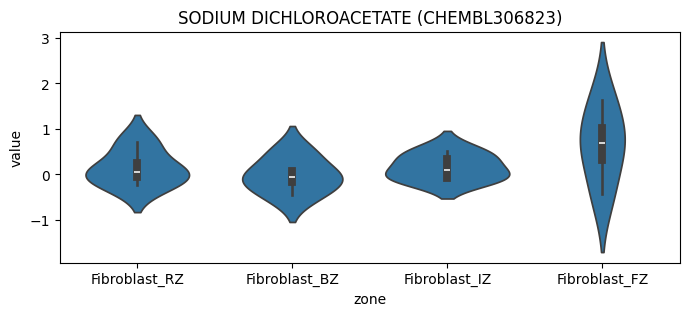

In [25]:
node="CHEMBL306823"
cg="Fibroblast"
cg_kgs = tlda.cellgroupdata[cg]["kg"]

if kg.node_type_overlap(node, "drug"):

    genes = set(kg._get_predecessors(node, ntype="gene", n=1))
    print(genes)

    subckgs = {}
    for ending in ["RZ", "BZ", "IZ", "FZ"]:
        sgname = "{}_{}".format(cg, ending)
        subckgs[sgname] = cg_kgs[sgname].subset_kg(genes).kg
        

    ddf = pd.DataFrame.from_dict(dci.score_subgraphs( subckgs, score_field="fc_score"))
    ddf.index = genes
    
    df = ddf.stack().reset_index(name='value')
    df.columns = ["gene", "zone", "value"]

    fig, ax = plt.subplots(figsize=(8, 3))
    sns.violinplot(df, x="zone", y="value", ax=ax)
    plt.title("{} ({})".format(kg.kg.nodes[node].get("name", node), node))
    print(ddf)

In [87]:
dtdf = drug_tgt_df.replace([np.inf, -np.inf], np.nan).dropna(axis=0)

In [88]:
dtdf

,cellgroup,id,name,numtargets,RZ_median,RZ_cohend,BZ_median,BZ_cohend,IZ_median,IZ_cohend,FZ_median,FZ_cohend
0,Adipocyte,CHEMBL628,PENTOXIFYLLINE,25,0.000000,0.279698,0.000000,0.055736,0.000000,0.131877,0.000000,-0.150920
1,Adipocyte,CHEMBL1096882,FLUDARABINE PHOSPHATE,12,1.119106,0.326774,0.046220,-0.385171,0.320366,-0.068195,0.222938,0.080623
2,Adipocyte,CHEMBL1200485,SORAFENIB TOSYLATE,9,0.048678,0.062881,0.000000,-0.119455,0.502344,0.295793,0.409187,-0.099839
3,Adipocyte,CHEMBL1421,DASATINIB,14,0.815569,0.277858,0.000000,0.131135,1.061976,0.362701,0.297630,-0.233910
5,Adipocyte,CHEMBL3039502,DUVELISIB,2,0.752345,0.757876,1.138357,1.103631,0.499141,0.763789,-0.159223,-0.990874
...,...,...,...,...,...,...,...,...,...,...,...,...
35081,vSMCs,CHEMBL1201237,LEVOBUNOLOL,2,0.228852,1.078411,0.195070,1.031551,-0.647216,0.236916,-0.928996,-0.974172
35085,vSMCs,CHEMBL3545247,CAL-263,2,0.544811,0.996448,0.801833,6.935677,1.248735,2.135402,0.147519,-1.500935
35088,vSMCs,CHEMBL482767,SNS-314,3,0.000000,0.431231,0.623560,0.511781,0.000000,0.180766,0.144398,-0.411576
35103,vSMCs,CHEMBL668,PROTRIPTYLINE,2,-0.171706,-0.002778,-0.024343,0.849112,-0.417674,-0.546470,-0.171033,0.103883


In [151]:
dtdf.query("cellgroup=='Fibroblast'").query("10 < numtargets < 30").sort_values("FZ_cohend", ascending=False)

,cellgroup,id,name,numtargets,RZ_median,RZ_cohend,BZ_median,BZ_cohend,IZ_median,IZ_cohend,FZ_median,FZ_cohend
13810,Fibroblast,CHEMBL37744,ZIMELDINE,17,0.000000,-0.221315,0.000000,-0.317913,0.000000,-0.447611,0.000000,0.335143
13178,Fibroblast,CHEMBL248702,DEXFENFLURAMINE,17,0.000000,-0.221315,0.000000,-0.317913,0.000000,-0.447611,0.000000,0.335143
13395,Fibroblast,CHEMBL2311030,ERGOLOID MESYLATES,13,0.000000,-0.194136,-0.079102,-0.321302,-0.044574,-0.362192,0.000000,0.332931
14238,Fibroblast,CHEMBL2364968,ERGOLOID,13,0.000000,-0.194136,-0.079102,-0.321302,-0.044574,-0.362192,0.000000,0.332931
12907,Fibroblast,CHEMBL243712,AMISULPRIDE,19,0.000000,-0.207386,0.000000,-0.313326,0.000000,-0.428042,0.000000,0.322169
...,...,...,...,...,...,...,...,...,...,...,...,...
12796,Fibroblast,CHEMBL888,GEMCITABINE,12,0.004708,0.561856,0.029717,0.822960,-0.391458,-0.077812,-0.214431,-0.357486
13600,Fibroblast,CHEMBL1980297,ILORASERTIB,18,-0.013876,0.251843,-0.044323,0.057491,0.355614,0.745646,-0.060480,-0.383950
12783,Fibroblast,CHEMBL1421,DASATINIB,14,0.042308,0.427474,0.002900,0.351088,0.050486,0.507432,-0.041118,-0.428252
13719,Fibroblast,CHEMBL359164,TROXACITABINE,11,0.021792,0.736636,0.077583,0.990084,-0.407303,-0.076934,-0.219675,-0.439519


In [114]:
dtdf.to_csv("drug_relevance_per_cellgroup.tsv", sep="\t")

In [26]:
cg = "Fibroblast"
#mod = "Fibroblast_FZ_mod_20"

#modKG = tlda.cellgroupdata[cg]["communities_enhanced"][mod]
modKG = tlda.cellgroupdata[cg]["kg"]["{}_FZ".format(cg)]
cgKGs = tlda.cellgroupdata[cg]["kg"]

In [115]:
edgeScoreAccessor = lambda x: x.get("fc_score", 0)

all_genes = [x for x in modKG.kg.nodes if tlda.fullKG.node_type_overlap(x, ["gene", "TF", "ncRNA"])]

gene_expressions = defaultdict(list)
for cond in cgKGs:
    condkg = cgKGs[cond]

    gene_expressions[cond] = condkg.get_edge_scores(edgeScoreAccessor, nodes=all_genes)

    
fig, ax = plt.subplots()

minValue = 0
maxValue = 0
for cond in gene_expressions:
    #print(cond, len(gene_expressions[cond]), gene_expressions[cond])

    minValue = min(gene_expressions[cond] + [minValue])
    maxValue = max(gene_expressions[cond] + [maxValue])

    dcolors = {"FZ": "red", "BZ": "blue", "RZ": "green", "IZ": "orange"}

    ucolor = None
    for zn in dcolors:
        if zn in cond:
            ucolor = dcolors[zn]
    
    _ = ax.hist(gene_expressions[cond], len(gene_expressions[cond]), density=True, color=ucolor,
                    histtype='step', cumulative=True, label='{}'.format(cond))

ax.grid(True)
ax.legend(loc='lower right')
ax.set_title("Edge Scores per DNET")

ax.set_xlabel("Edge score")
ax.set_ylabel("Fraction of Edges")

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

KeyboardInterrupt: 

In [27]:
mod_geneKG = modKG.to_gene_kgraph()

In [28]:
potentialTFs = Counter()
potentialTFScores = Counter()
tf2targets = defaultdict(set)

for gene in mod_geneKG.kg.nodes:

    for ogene, _ in kg.kg.in_edges(gene):
        if kg.node_type_overlap(ogene, ["TF"]):

            if mod_geneKG.kg.edges[ogene, gene].get("fc_score", 0) != 0:
                potentialTFs[ogene] += 1
                tf2targets[ogene].add(gene)
                potentialTFScores[ogene] += abs(mod_geneKG.kg.edges[ogene, gene].get("fc_score", 0))

print(len(potentialTFs))
potentialTFScores.most_common(10)

980


[('AR', 3752.1289645194433),
 ('FOS', 1720.875408060538),
 ('E2F4', 608.1195324101875),
 ('CTCF', 602.7762496664058),
 ('TP53', 585.9474944345387),
 ('EGR1', 578.3321212112977),
 ('ESR1', 567.3514196269716),
 ('HIF1A', 488.3147483685031),
 ('MYC', 467.3364895948272),
 ('SP1', 457.8172592596222)]

In [120]:
records = []
for gene in potentialTFScores:
    edgeScores = set()
    for tgt in tf2targets[gene]:
        tfedge = cgKGs["Fibroblast_FZ"].kg.edges[(gene, tgt)]
        
        edgeScores.add((tfedge["type"], tfedge["fc_score"]))

    nodeScore = cgKGs["Fibroblast_FZ"].kg.nodes[gene]["fc_score"]
    edgeScore = np.mean([x[1] for x in edgeScores])    

    if nodeScore < 0.1 or edgeScore < 0.1:
        continue

    records.append((gene, len(tf2targets[gene]), nodeScore, edgeScore))
    
    #print(gene, potentialTFs[gene], nodeScore, edgeScore, edgeScores)
    #print()

relevantTFs = pd.DataFrame.from_records(records)
relevantTFs.columns = ["gene", "targets", "node_score", "mean_edge_score"]
relevantTFs=relevantTFs.sort_values("mean_edge_score", ascending=False)
relevantTFs.head()

,gene,targets,node_score,mean_edge_score
46,FOSB,52,5.167900,2.332058
72,HIF3A,17,1.475343,2.241796
22,NFATC2,130,3.194039,1.923896
76,ZBTB16,66,1.725449,1.452954
41,AEBP1,5,1.581911,1.423229


<Axes: xlabel='mean_edge_score', ylabel='gene'>

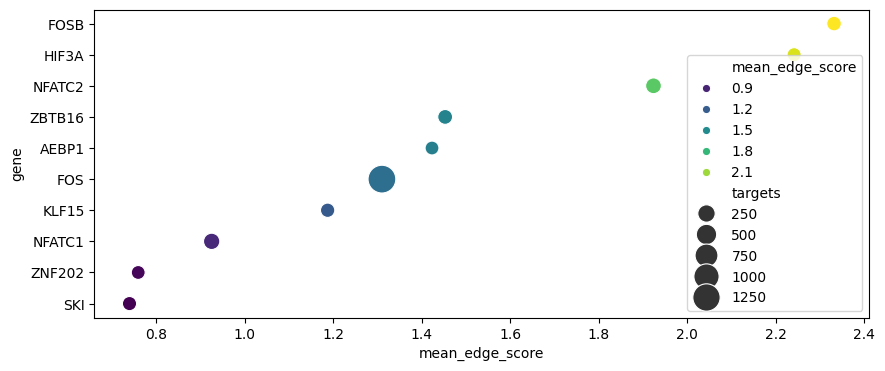

In [121]:
fig, ax=plt.subplots(figsize=(10, 4))
sns.scatterplot(ax=ax, sizes=(100, 400), data=relevantTFs[relevantTFs.targets >= 5].head(10), x="mean_edge_score", y="gene", hue="mean_edge_score", size="targets", palette="viridis")

In [ ]:
_=modKG.to_gene_kgraph().plot_graph()

In [ ]:
cgKGs

In [ ]:
subgroup_scores = dict()
for sg in cgKGs:
    subgroup_scores[sg] = cgKGs[sg].get_node_scores(score_accessor=lambda x: x.get("fc_score", 0))

df = pd.DataFrame.from_dict(subgroup_scores)
sns.violinplot(data=df)
plt.title(cg)
plt.ylabel("Node scores")

In [ ]:
subgroup_scores = dict()
for sg in cgKGs:
    subgroup_scores[sg] = cgKGs[sg].get_edge_scores(score_accessor=lambda x: x.get("fc_score", 0))

df = pd.DataFrame.from_dict(subgroup_scores)
sns.violinplot(data=df)
plt.title(cg)
plt.ylabel("Edge scores")

In [ ]:
xTotalCount = 0
for x in tlda.cellgroupdata:
    xcommcount = len(tlda.cellgroupdata[x]["communities"])
    print(x, xcommcount)
    xTotalCount += xcommcount

xTotalCount

In [ ]:
fibModules=rel_modules[rel_modules.base_condition.str.startswith("Fibroblast")]
fibModules

In [ ]:
dcolors = {"FZ": "red", "BZ": "blue", "RZ": "green", "IZ": "orange"}

tlda.plot_module_description(nrow=2, figsize=(20,8), dcolors=dcolors)

In [28]:
aid = AIDescriptor(model_name="mradermacher/Collaiborator-MEDLLM-Llama-3-8B-v1-i1-GGUF", model_file="Collaiborator-MEDLLM-Llama-3-8B-v1.i1-Q4_K_M.gguf")

In [ ]:
context = "fibroblasts of human heart"

for fibmod in ["Fibroblast_FZ_mod_20"]:
    print(fibmod)
    
    res=aid.query_genelist(tlda.communities[fibmod], context, verbose=True, word_cloud=True)
    plt.show()
    plt.close()
    
    print(res)
    print()

In [ ]:
kg.plot_edge_types(show_threshold=0.001)

In [ ]:
context = "fibroblasts of human heart"
for fibmod in fibModules.name:
    print(fibmod)
    
    res=aid.query_genelist(tlda.communities[fibmod], context, verbose=True, word_cloud=True)
    plt.show()
    plt.close()
    
    print(res)
    print()

In [100]:
allSigKG = dict(tlda.cellgroupdata["Myeloid"]["communities_enhanced"], **tlda.cellgroupdata["Fibroblast"]["communities_enhanced"]) #**tlda.cellgroupdata["Cardiomyocyte"]["communities_enhanced"], **tlda.cellgroupdata["vSMCs"]["communities_enhanced"],

In [101]:
mc = ModuleCompare()

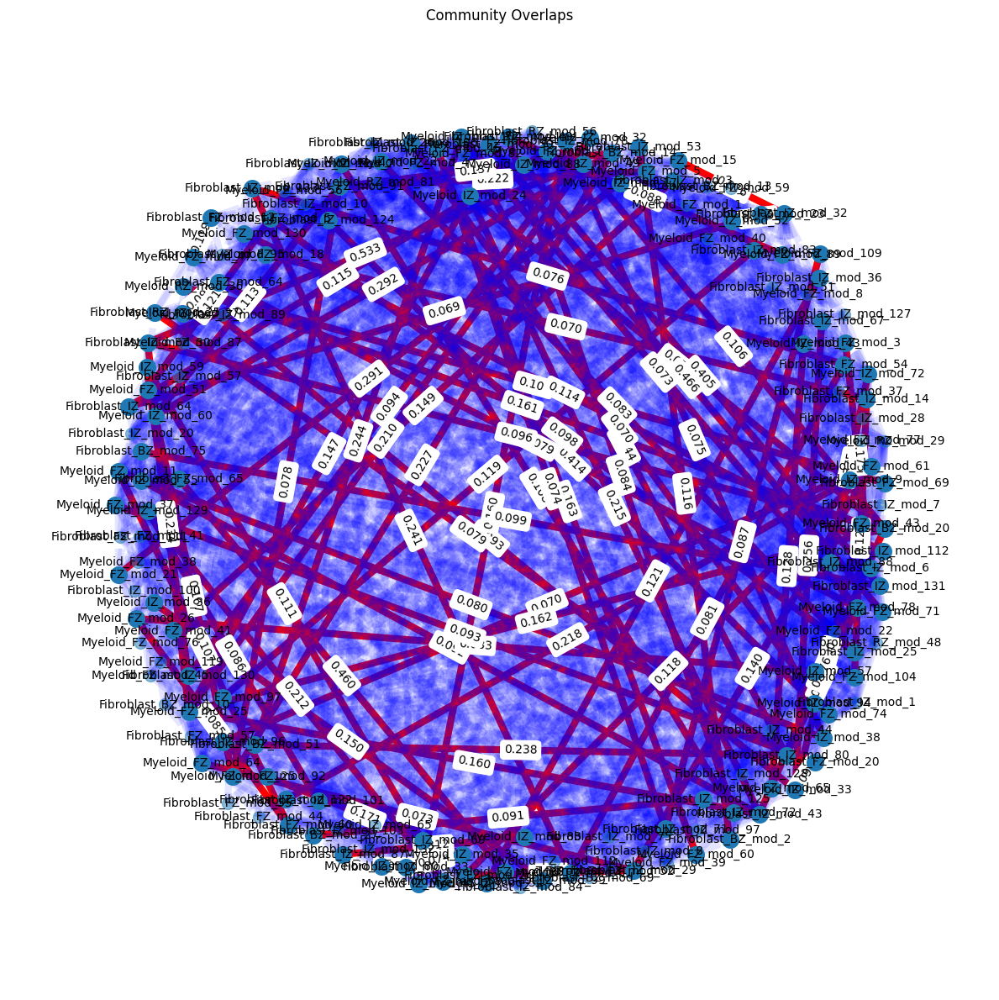

In [102]:
jaccardSims = mc.network_compare_modules(allSigKG, measure="jaccard", borderWeightQuantile=0.95)

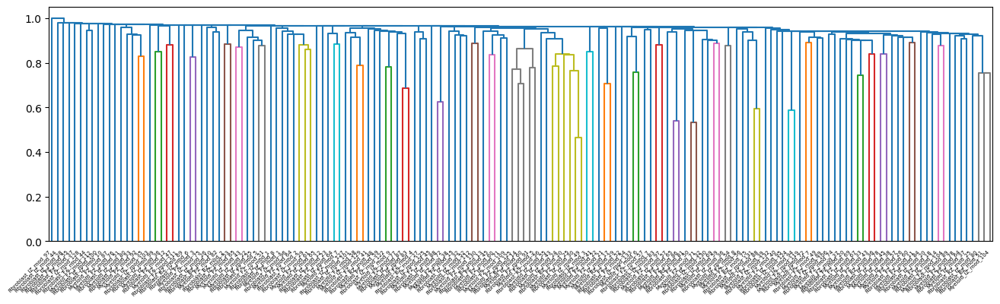

In [103]:
mc.plot_dendrogram(jaccardSims, figsize=(16, 4), color_threshold=0.9)

In [104]:
jdf = mc.module_similarities_to_df(jaccardSims)
jdf

,Community1,Community2,Similarity
2154,Myeloid_IZ_mod_49,Fibroblast_IZ_mod_30,0.533333
8510,Myeloid_FZ_mod_71,Fibroblast_FZ_mod_50,0.465517
9082,Myeloid_FZ_mod_86,Fibroblast_FZ_mod_65,0.460000
2868,Myeloid_IZ_mod_94,Fibroblast_IZ_mod_124,0.413793
3474,Myeloid_IZ_mod_88,Fibroblast_IZ_mod_131,0.404762
...,...,...,...
4834,Myeloid_FZ_mod_112,Fibroblast_FZ_mod_20,0.000000
4835,Myeloid_FZ_mod_112,Fibroblast_FZ_mod_2,0.000000
4836,Myeloid_FZ_mod_112,Fibroblast_FZ_mod_5,0.000000
4837,Myeloid_FZ_mod_112,Fibroblast_FZ_mod_69,0.000000


/mnt/extproj/projekte/bartelt/software/miniconda3/envs/regnetworks/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/mnt/extproj/projekte/bartelt/software/miniconda3/envs/regnetworks/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


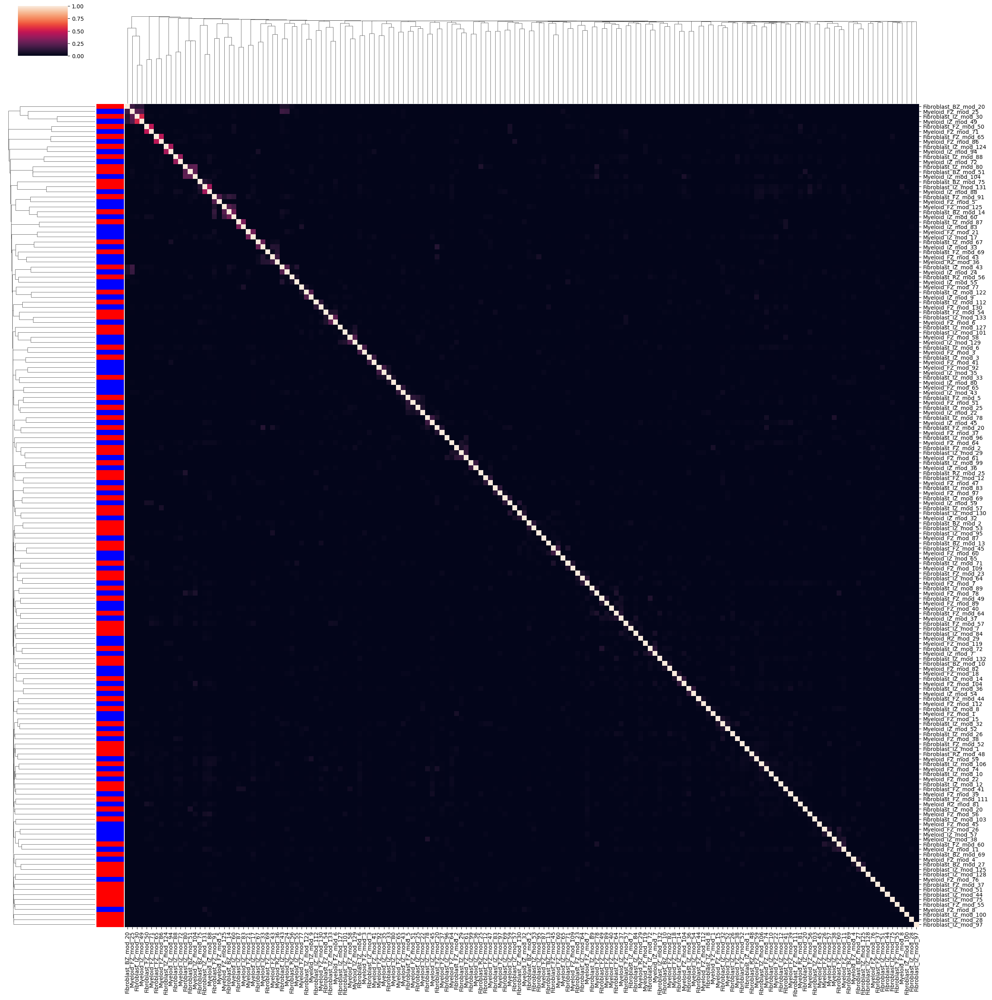

In [105]:
mods = sorted(set(list(jdf.Community1) + list(jdf.Community2)))
pjdf = pd.DataFrame( np.diag( [1.0]*(len(mods)) ), index=mods, columns=mods)

for ri, row in jdf.iterrows():
    pjdf.loc[row["Community1"], row["Community2"] ] = row["Similarity"]
    pjdf.loc[row["Community2"], row["Community1"] ] = row["Similarity"]

colors = [x.split("_")[0] for x in pjdf.index]

lut = dict(zip(set(colors), "rbgr"))
row_colors = pd.Series(colors).map(lut)
row_colors.columns = "Tissue"
sns.clustermap(pjdf, row_colors=row_colors.values, figsize=(25,25), dendrogram_ratio=0.1, colors_ratio=0.03, cbar_pos=(0.02, 0.95, 0.05, 0.05), xticklabels=True, yticklabels=True)

2025-03-25 19:56:45 Looks like you are using a tranform that doesn't support FancyArrowPatch, using ax.annotate instead. The arrows might strike through texts. Increasing shrinkA in arrowprops might help.


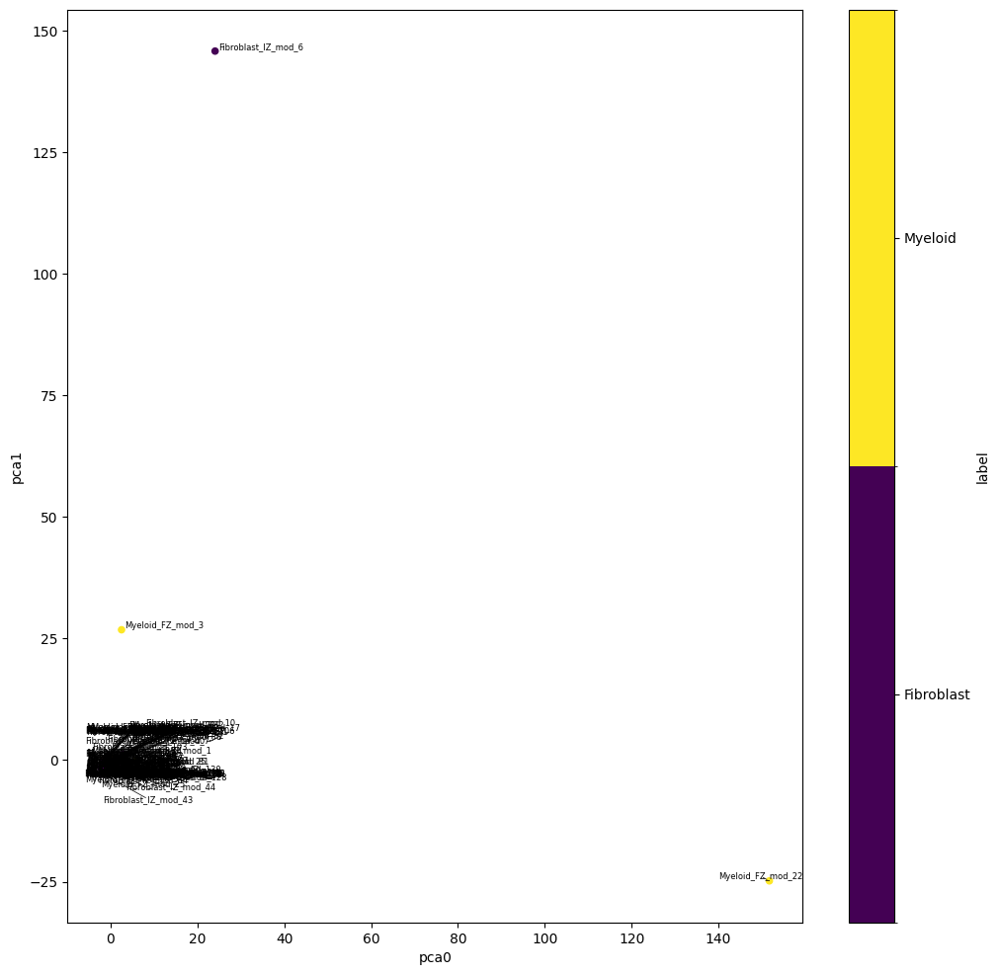

In [106]:
emb = mc.module_pca(allSigKG, kg)

In [107]:
ns = NETSIM(kg)

|#########################################################| 100% Time:  2:50:2014


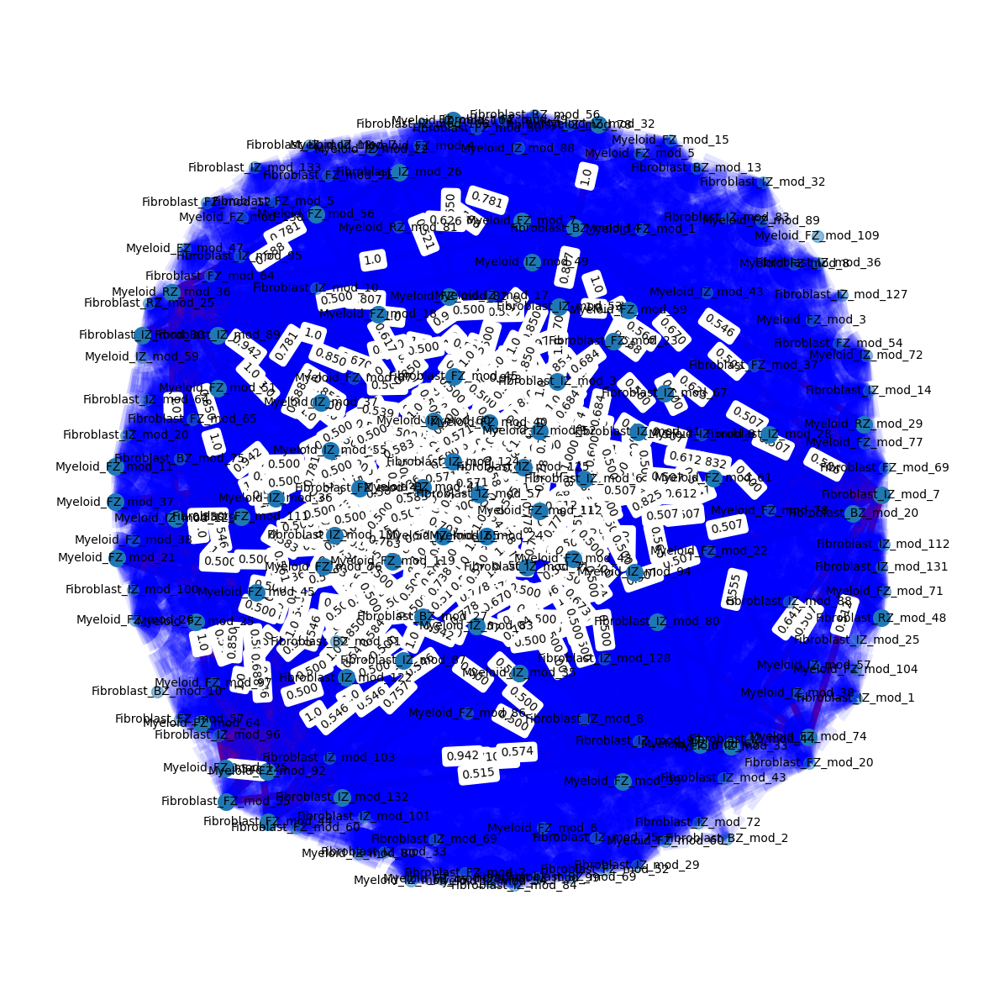

In [108]:
modNetSims = mc.network_compare_netsim(allSigKG, ns=ns, max_terms=2, borderWeightQuantile=0.95)

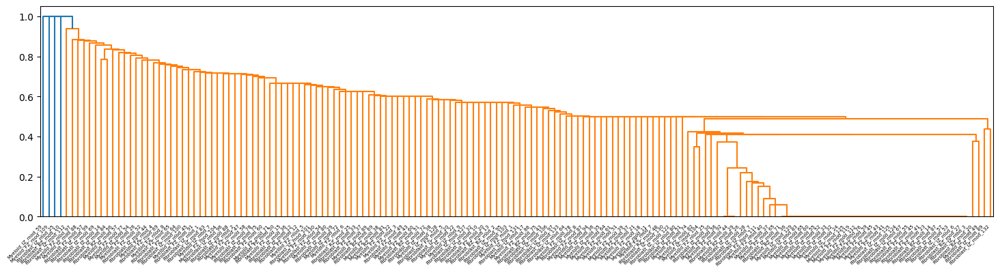

In [109]:
mc.plot_dendrogram(modNetSims, figsize=(18,4))

In [110]:
singlecatKGs = dict(tlda.cellgroupdata["Fibroblast"]["communities_enhanced"])

|#########################################################| 100% Time:  0:50:2906


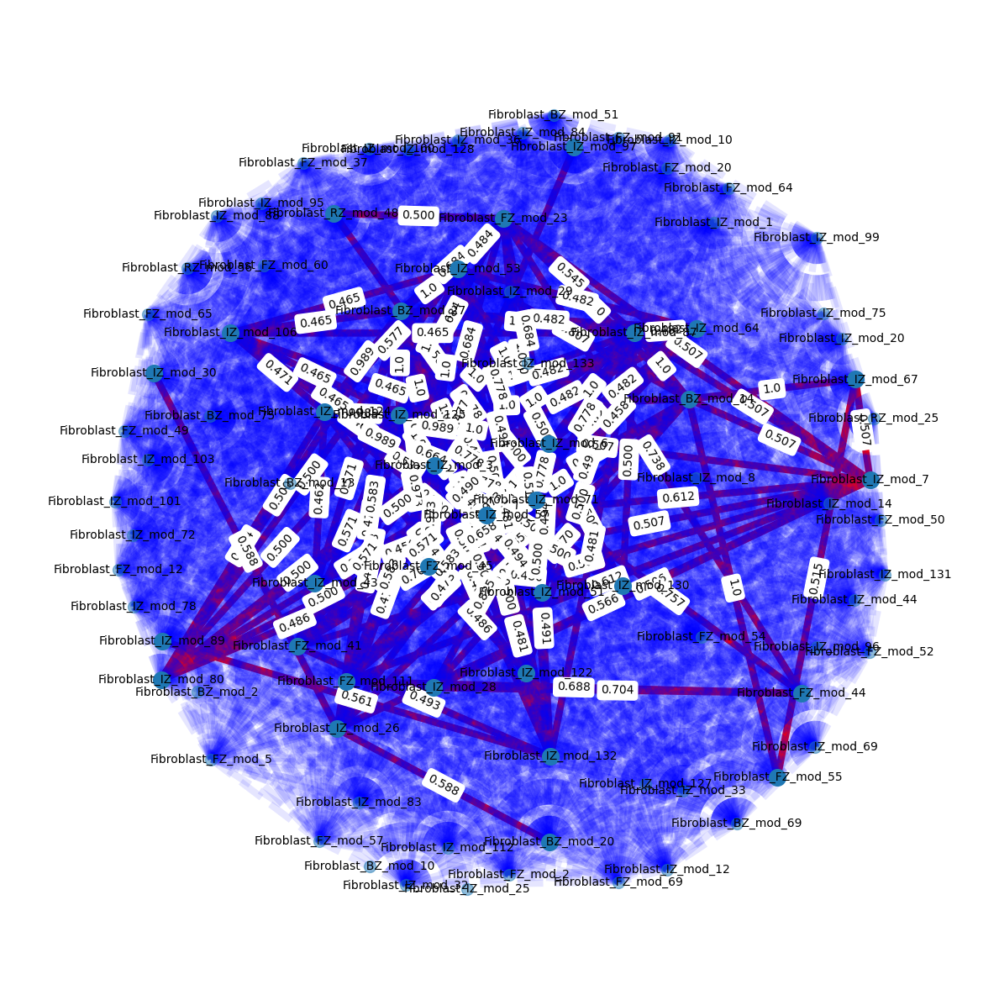

In [111]:
modNetSims_single = mc.network_compare_netsim(singlecatKGs, ns=ns, max_terms=2, borderWeightQuantile=0.95)

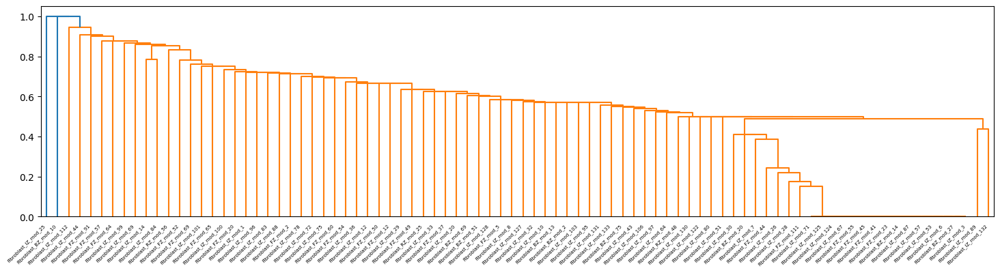

In [112]:
mc.plot_dendrogram(modNetSims_single, figsize=(18,4))

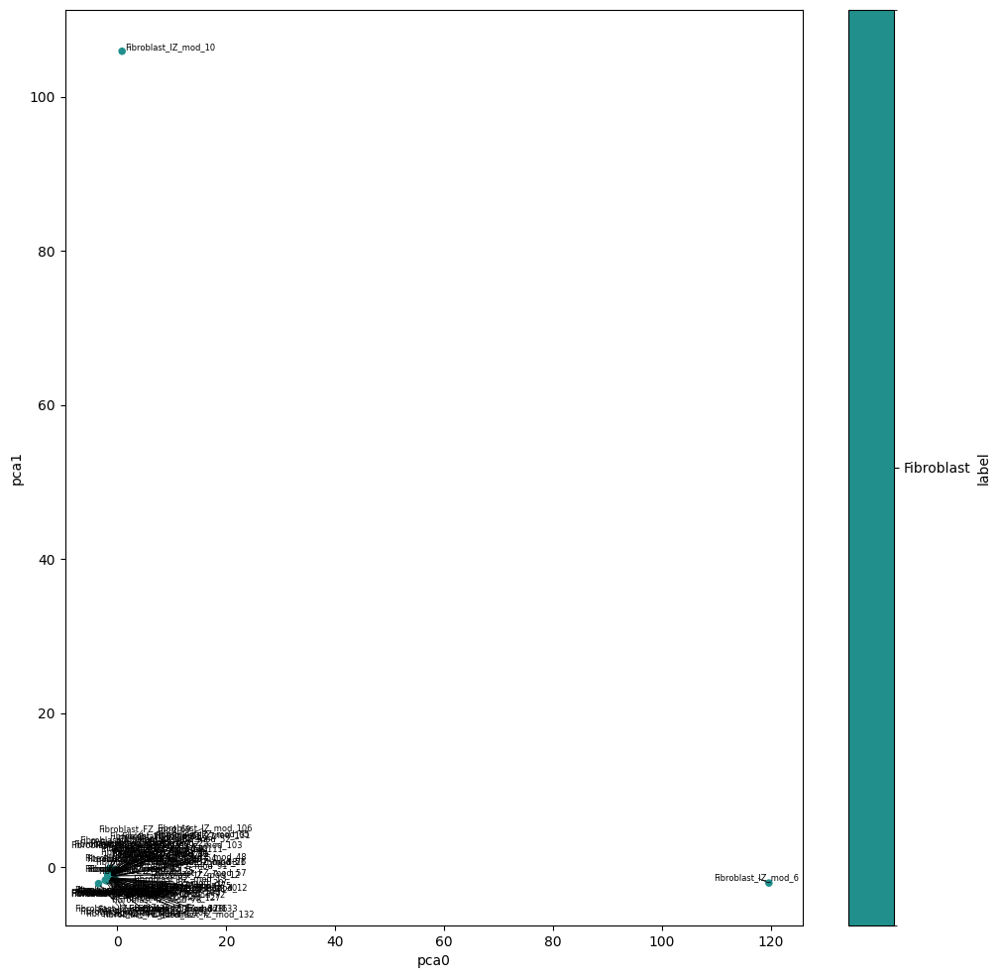

In [113]:
emb = mc.module_pca(singlecatKGs, kg)